# Trabalho C2 Projeto Integrador 3 -> Análise de Criminalidade

**Matéria:** Projeto Integrador Computação 3

**Professor:** Howard Cruz Roatti

**Tema:** Análise de Criminalidade

**Grupo:** 

* Gabriel Ferreira Paulo; 
* João Pereira Paes Henriques; 
* Murilo Henrique Costa Reis; 
* Pedro de Oliveira Guimarães; 
* Thaís Peroni Custódio Lino.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.io as pio
import json
import requests

from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor

In [2]:
df = pd.read_csv('BancoVDE_Consolidado.csv', sep=';', low_memory=False)
print(f'Total de registros: {len(df):,}')
print(f'Colunas: {list(df.columns)}')

Total de registros: 8,752,250
Colunas: ['uf', 'municipio', 'evento', 'data_referencia', 'agente', 'arma', 'faixa_etaria', 'feminino', 'masculino', 'nao_informado', 'total_vitima', 'total', 'total_peso', 'abrangencia', 'Ano']


In [3]:
df.info()
df.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8752250 entries, 0 to 8752249
Data columns (total 15 columns):
 #   Column           Dtype  
---  ------           -----  
 0   uf               object 
 1   municipio        object 
 2   evento           object 
 3   data_referencia  object 
 4   agente           object 
 5   arma             object 
 6   faixa_etaria     object 
 7   feminino         float64
 8   masculino        float64
 9   nao_informado    float64
 10  total_vitima     float64
 11  total            float64
 12  total_peso       float64
 13  abrangencia      object 
 14  Ano              int64  
dtypes: float64(6), int64(1), object(8)
memory usage: 1001.6+ MB


,uf,municipio,evento,data_referencia,agente,arma,faixa_etaria,feminino,masculino,nao_informado,total_vitima,total,total_peso,abrangencia,Ano
0,AC,ACRELÂNDIA,Feminicídio,2015-01-01,NaN,NaN,NaN,0.0,0.0,0.0,0.0,NaN,NaN,Estadual,2015
1,AC,ACRELÂNDIA,Feminicídio,2015-02-01,NaN,NaN,NaN,0.0,0.0,0.0,0.0,NaN,NaN,Estadual,2015
2,AC,ACRELÂNDIA,Feminicídio,2015-03-01,NaN,NaN,NaN,0.0,0.0,0.0,0.0,NaN,NaN,Estadual,2015
3,AC,ACRELÂNDIA,Feminicídio,2015-04-01,NaN,NaN,NaN,0.0,0.0,0.0,0.0,NaN,NaN,Estadual,2015
4,AC,ACRELÂNDIA,Feminicídio,2015-05-01,NaN,NaN,NaN,0.0,0.0,0.0,0.0,NaN,NaN,Estadual,2015


## 1. Análise do número de crimes em cada Estado/Município

##### Número de cada tipo de crime por Estado e município (Quais Estados e municípios são mais "Perigosos" e quais crimes ocorrem mais em cada Estado)

In [4]:
# 1. Análise do número de crimes em cada Estado/Município
df.columns

Index(['uf', 'municipio', 'evento', 'data_referencia', 'agente', 'arma',
       'faixa_etaria', 'feminino', 'masculino', 'nao_informado',
       'total_vitima', 'total', 'total_peso', 'abrangencia', 'Ano'],
      dtype='object')

agrupando por estado, municipio e tipo de crime

In [5]:
crimes_estado_municipio = df.groupby(['uf', 'municipio', 'evento'])['total'].sum().reset_index()

crimes_estado_municipio.head()

,uf,municipio,evento,total
0,AC,ACRELÂNDIA,Feminicídio,0.0
1,AC,ACRELÂNDIA,Homicídio doloso,0.0
2,AC,ACRELÂNDIA,Lesão corporal seguida de morte,0.0
3,AC,ACRELÂNDIA,Mandado de prisão cumprido,358.0
4,AC,ACRELÂNDIA,Morte no trânsito ou em decorrência dele (exce...,0.0


A tabela abaixo só representa os municipos que tiveram crimes acima de 0

In [6]:
crimes_estado_municipio = crimes_estado_municipio[crimes_estado_municipio['total'] > 0]

crimes_estado_municipio.head()

,uf,municipio,evento,total
3,AC,ACRELÂNDIA,Mandado de prisão cumprido,358.0
14,AC,ASSIS BRASIL,Mandado de prisão cumprido,208.0
25,AC,BRASILÉIA,Mandado de prisão cumprido,268.0
36,AC,BUJARI,Mandado de prisão cumprido,266.0
47,AC,CAPIXABA,Mandado de prisão cumprido,167.0


#### Estados mais perigosos

In [7]:
total_estado = df.groupby('uf')['total'].sum().sort_values(ascending=False)

total_estado.head()

uf
SP    10587885.0
SC     7520460.0
RJ     5085203.0
GO     4178263.0
PR     4144961.0
Name: total, dtype: float64

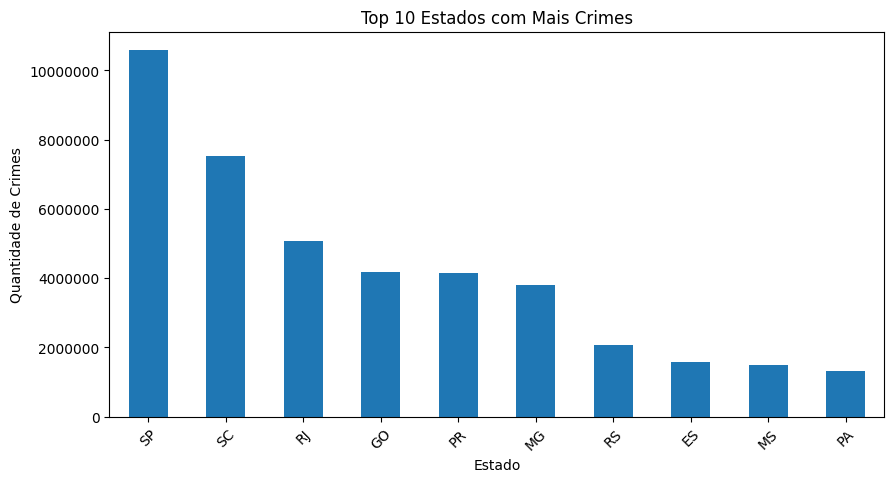

In [8]:
ax = total_estado.head(10).plot(kind='bar', figsize=(10,5))

plt.title('Top 10 Estados com Mais Crimes')
plt.xlabel('Estado')
plt.ylabel('Quantidade de Crimes')
plt.xticks(rotation=45)

ax.ticklabel_format(style='plain', axis='y')

plt.show()

abaixo foi criado df_municipio_limpo para tirar os municipios "NÃO INFORMAdOS" pois não dava para saber qual era o municipio de maior ocorrência ja que a maioria era os "NÃO INFORMADOS"

In [9]:
df_municipio_limpo = df[
    df['municipio'] != 'NÃO INFORMADO'
]

##### Municipios mais perigosos, sem contar os não informados

In [10]:
total_municipio = df_municipio_limpo.groupby(['uf', 'municipio'])['total'].sum().sort_values(ascending=False)

total_municipio.head(10)

uf  municipio            
SP  SÃO PAULO                137558.0
RJ  RIO DE JANEIRO            59254.0
PR  CURITIBA                  43762.0
MS  CAMPO GRANDE              29489.0
AM  MANAUS                    24497.0
SP  SOROCABA                  23908.0
    SÃO JOSÉ DO RIO PRETO     20450.0
    CAMPINAS                  16382.0
PR  LONDRINA                  16199.0
RO  PORTO VELHO               15841.0
Name: total, dtype: float64

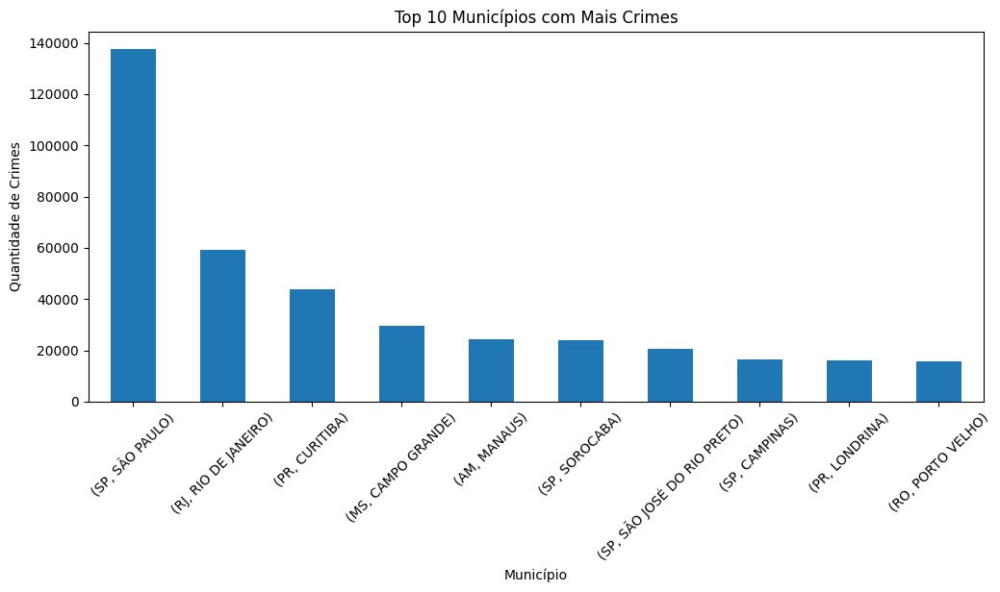

In [11]:
ax = total_municipio.head(10).plot(kind='bar', figsize=(12,5))

plt.title('Top 10 Municípios com Mais Crimes')
plt.xlabel('Município')
plt.ylabel('Quantidade de Crimes')
plt.xticks(rotation=45)

plt.show()

agrupando estados que tiveram determinando crimes

In [12]:
crimes_estado = df.groupby(['uf', 'evento'])['total'].sum().reset_index()

crimes_estado = crimes_estado[crimes_estado['total'] > 0]

crimes_estado.head()

,uf,evento,total
2,AC,Arma de Fogo Apreendida,3836.0
3,AC,Atendimento pré-hospitalar,3546.0
4,AC,Busca e salvamento,10445.0
5,AC,Combate a incêndios,16770.0
6,AC,Emissão de Alvarás de licença,38849.0


o código diz qual crime acontece mais em cada estado, baseado na quantidade total, exceto alguns eventos que não são considerados crime

In [13]:
crimes_reais = crimes_estado[~crimes_estado['evento'].isin([
    'Realização de vistorias',
    'Atendimento pré-hospitalar',
    'Emissão de Alvarás de licença',
    'Busca e salvamento',
    'Combate a incêndios'
])]

In [14]:
crime_ordenado = crimes_reais.sort_values(['uf', 'total'], ascending=[True, False])

crime_top_estado = crime_ordenado.groupby('uf').first().reset_index()

crime_top_estado

,uf,evento,total
0,AC,Mandado de prisão cumprido,14285.0
1,AL,Roubo de veículo,25629.0
2,AM,Mandado de prisão cumprido,34322.0
3,AP,Mandado de prisão cumprido,11548.0
4,BA,Roubo de veículo,137052.0
5,CE,Roubo de veículo,89105.0
6,DF,Mandado de prisão cumprido,93714.0
7,ES,Tráfico de drogas,40822.0
8,GO,Furto de veículo,66084.0
9,MA,Roubo de veículo,46533.0


Foram desconsideradas ocorrências de natureza administrativa, mantendo apenas eventos caracterizados como crimes, a fim de garantir maior precisão na análise.

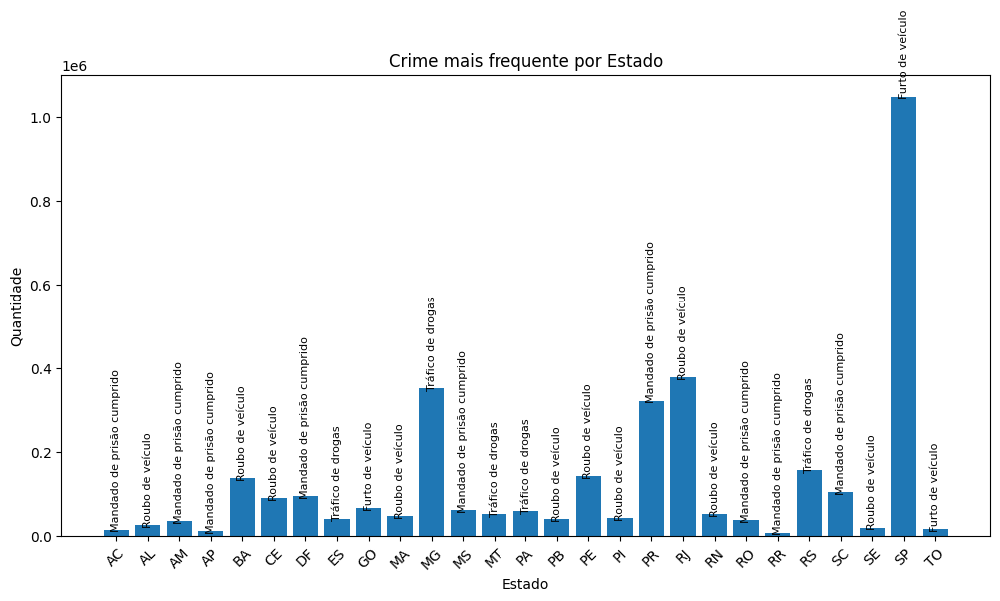

In [15]:
plt.figure(figsize=(12,6))

bars = plt.bar(crime_top_estado['uf'], crime_top_estado['total'])

for i, txt in enumerate(crime_top_estado['evento']):
    plt.text(i, crime_top_estado['total'][i], txt, rotation=90, ha='center', fontsize=8)

plt.title('Crime mais frequente por Estado')
plt.xlabel('Estado')
plt.ylabel('Quantidade')

plt.xticks(rotation=45)
plt.show()

In [16]:
# removendo o ano de 2026 da analise (apenas 4 meses para analisar)
df = df[df['Ano'] != 2026]

In [17]:
crimes_por_ano = df.groupby('Ano')['total'].sum().sort_index()

crimes_por_ano

Ano
2015    3470703.0
2016    3848005.0
2017    4202848.0
2018    4864905.0
2019    5059375.0
2020    4253931.0
2021    4594095.0
2022    4718314.0
2023    4762023.0
2024    4927974.0
2025    5398371.0
Name: total, dtype: float64

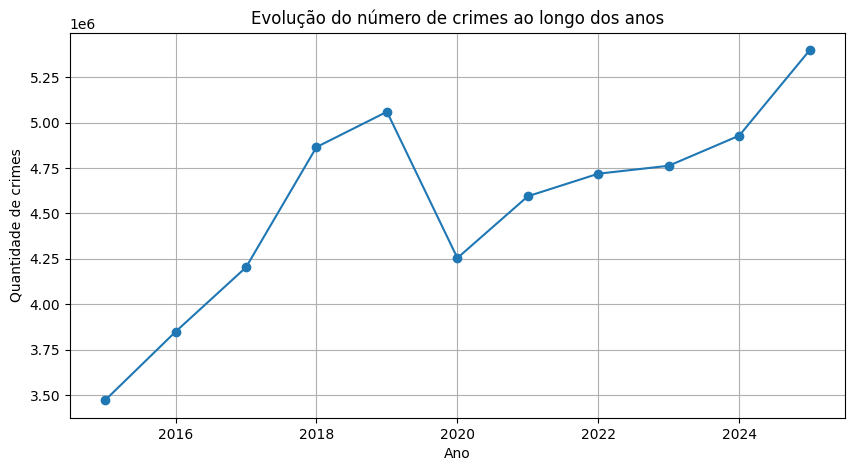

In [18]:
plt.figure(figsize=(10,5))

crimes_por_ano.plot(marker='o')

plt.title('Evolução do número de crimes ao longo dos anos')
plt.xlabel('Ano')
plt.ylabel('Quantidade de crimes')

plt.grid()
plt.show()

In [19]:
df = df[~df['evento'].isin([
    'Realização de vistorias',
    'Atendimento pré-hospitalar',
    'Emissão de Alvarás de licença',
    'Combate a incêndios',
    'Busca e salvamento'
])]

In [20]:
# agrupa por ano e tipo de cime
crimes_tipo_ano = df.groupby(['Ano', 'evento'])['total'].sum().reset_index()

tabela_pivot = crimes_tipo_ano.pivot(index='Ano', columns='evento', values='total').fillna(0)

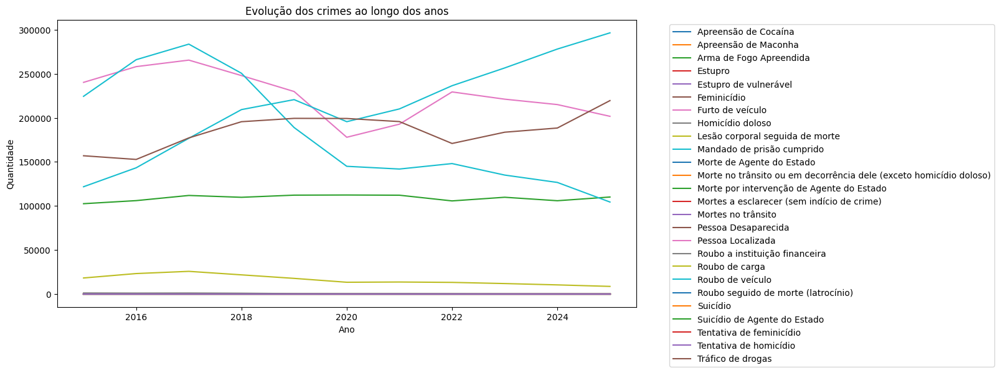

In [21]:
tabela_pivot.plot(figsize=(12,6))

plt.title('Evolução dos crimes ao longo dos anos')
plt.xlabel('Ano')
plt.ylabel('Quantidade')

plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

In [22]:
df_limpo = df[~df['evento'].isin([
    'Realização de vistorias',
    'Atendimento pré-hospitalar',
    'Emissão de Alvarás de licença',
    'Combate a incêndios',
    'Busca e salvamento'
])]

In [23]:
crimes_tipo_ano = df_limpo.groupby(['Ano', 'evento'])['total'].sum().reset_index()

tabela_pivot = crimes_tipo_ano.pivot(index='Ano', columns='evento', values='total').fillna(0)

In [24]:
top_crimes = df_limpo.groupby('evento')['total'].sum().sort_values(ascending=False).head(5).index

tabela_top = tabela_pivot[top_crimes]

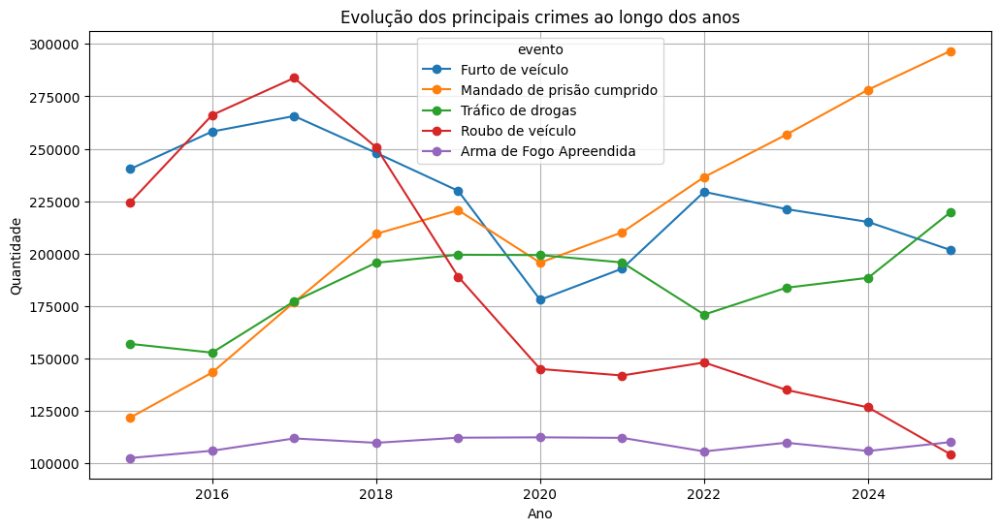

In [25]:
tabela_top.plot(figsize=(12,6), marker='o')

plt.title('Evolução dos principais crimes ao longo dos anos')
plt.xlabel('Ano')
plt.ylabel('Quantidade')

plt.grid()
plt.show()

#### Realizar uma análise de Regressão , prever em quais Estado do Sudeste havera aumento ou diminuição de crimes

## Analise do Estado do ES

In [26]:
df_exemplo = df_limpo[
    (df_limpo['uf'] == 'ES') &
    (df_limpo['evento'] == 'Tráfico de drogas')
]

In [27]:
dados = df_exemplo.groupby('Ano')['total'].sum().reset_index()

dados

,Ano,total
0,2015,21.0
1,2016,24.0
2,2017,46.0
3,2018,4388.0
4,2019,5237.0
5,2020,5421.0
6,2021,5009.0
7,2022,4716.0
8,2023,4539.0
9,2024,4808.0


In [28]:
X = dados[['Ano']]
y = dados['total']

modelo = LinearRegression()
modelo.fit(X, y)

,"fit_intercept fit_intercept: bool, default=TrueWhether to calculate the intercept for this model. If setto False, no intercept will be used in calculations(i.e. data is expected to be centered).",True
,"copy_X copy_X: bool, default=TrueIf True, X will be copied; else, it may be overwritten.",True
,"tol tol: float, default=1e-6The precision of the solution (`coef_`) is determined by `tol` whichspecifies a different convergence criterion for the `lsqr` solver.`tol` is set as `atol` and `btol` of :func:`scipy.sparse.linalg.lsqr` whenfitting on sparse training data. This parameter has no effect when fittingon dense data... versionadded:: 1.7",1e-06
,"n_jobs n_jobs: int, default=NoneThe number of jobs to use for the computation. This will only providespeedup in case of sufficiently large problems, that is if firstly`n_targets > 1` and secondly `X` is sparse or if `positive` is setto `True`. ``None`` means 1 unless in a:obj:`joblib.parallel_backend` context. ``-1`` means using allprocessors. See :term:`Glossary ` for more details.",None
,"positive positive: bool, default=FalseWhen set to ``True``, forces the coefficients to be positive. Thisoption is only supported for dense arrays.For a comparison between a linear regression model with positive constraintson the regression coefficients and a linear regression without such constraints,see :ref:`sphx_glr_auto_examples_linear_model_plot_nnls.py`... versionadded:: 0.24",False


In [29]:
previsao = modelo.predict(pd.DataFrame({'Ano': [2027, 2028, 2029]}))

previsao

array([7511.19090909, 8066.76363636, 8622.33636364])

In [30]:
print("Coeficiente:", modelo.coef_)

Coeficiente: [555.57272727]


In [31]:
df_exemplo = df_limpo[
    (df_limpo['uf'] == 'SP') &
    (df_limpo['evento'] == 'Furto de veículo')
]

In [32]:
anos = [2027, 2028, 2029]

previsoes = modelo.predict(pd.DataFrame({'Ano': anos}))

coef = modelo.coef_[0]

tabela_previsao = pd.DataFrame({
    'Ano': anos,
    'Previsão de ocorrências': previsoes,
    'Coeficiente': coef
})

tabela_previsao

,Ano,Previsão de ocorrências,Coeficiente
0,2027,7511.190909,555.572727
1,2028,8066.763636,555.572727
2,2029,8622.336364,555.572727


## Analise do Estado de SP

In [33]:
df_exemplo = df_limpo[
    (df_limpo['uf'] == 'SP') &
    (df_limpo['evento'] == 'Furto de veículo')
]

In [34]:
dados = df_exemplo.groupby('Ano')['total'].sum().reset_index()

dados

,Ano,total
0,2015,110690.0
1,2016,110932.0
2,2017,104829.0
3,2018,99346.0
4,2019,90652.0
5,2020,65724.0
6,2021,79670.0
7,2022,96662.0
8,2023,94258.0
9,2024,93996.0


In [35]:
X = dados[['Ano']]
y = dados['total']

modelo = LinearRegression()
modelo.fit(X, y)

,"fit_intercept fit_intercept: bool, default=TrueWhether to calculate the intercept for this model. If setto False, no intercept will be used in calculations(i.e. data is expected to be centered).",True
,"copy_X copy_X: bool, default=TrueIf True, X will be copied; else, it may be overwritten.",True
,"tol tol: float, default=1e-6The precision of the solution (`coef_`) is determined by `tol` whichspecifies a different convergence criterion for the `lsqr` solver.`tol` is set as `atol` and `btol` of :func:`scipy.sparse.linalg.lsqr` whenfitting on sparse training data. This parameter has no effect when fittingon dense data... versionadded:: 1.7",1e-06
,"n_jobs n_jobs: int, default=NoneThe number of jobs to use for the computation. This will only providespeedup in case of sufficiently large problems, that is if firstly`n_targets > 1` and secondly `X` is sparse or if `positive` is setto `True`. ``None`` means 1 unless in a:obj:`joblib.parallel_backend` context. ``-1`` means using allprocessors. See :term:`Glossary ` for more details.",None
,"positive positive: bool, default=FalseWhen set to ``True``, forces the coefficients to be positive. Thisoption is only supported for dense arrays.For a comparison between a linear regression model with positive constraintson the regression coefficients and a linear regression without such constraints,see :ref:`sphx_glr_auto_examples_linear_model_plot_nnls.py`... versionadded:: 0.24",False


In [36]:
previsao = modelo.predict(pd.DataFrame({'Ano': [2027, 2028,2029]}))

previsao

array([79207.46363636, 77093.03636364, 74978.60909091])

In [37]:
print("Coeficiente:", modelo.coef_)

Coeficiente: [-2114.42727273]


In [38]:
anos = [2027, 2028, 2029]

previsoes = modelo.predict(pd.DataFrame({'Ano': anos}))

coef = modelo.coef_[0]

tabela_previsao = pd.DataFrame({
    'Ano': anos,
    'Previsão de ocorrências': previsoes,
    'Coeficiente': coef
})

tabela_previsao

,Ano,Previsão de ocorrências,Coeficiente
0,2027,79207.463636,-2114.427273
1,2028,77093.036364,-2114.427273
2,2029,74978.609091,-2114.427273


## Analise do Estado do RJ

In [39]:
df_exemplo = df_limpo[
    (df_limpo['uf'] == 'RJ') &
    (df_limpo['evento'] == 'Roubo de veículo')]

In [40]:
dados = df_exemplo.groupby('Ano')['total'].sum().reset_index()

dados

,Ano,total
0,2015,31035.0
1,2016,41696.0
2,2017,54366.0
3,2018,52097.0
4,2019,39749.0
5,2020,25425.0
6,2021,24332.0
7,2022,25198.0
8,2023,22248.0
9,2024,30930.0


In [41]:
X = dados[['Ano']]
y = dados['total']

modelo = LinearRegression()
modelo.fit(X, y)

,"fit_intercept fit_intercept: bool, default=TrueWhether to calculate the intercept for this model. If setto False, no intercept will be used in calculations(i.e. data is expected to be centered).",True
,"copy_X copy_X: bool, default=TrueIf True, X will be copied; else, it may be overwritten.",True
,"tol tol: float, default=1e-6The precision of the solution (`coef_`) is determined by `tol` whichspecifies a different convergence criterion for the `lsqr` solver.`tol` is set as `atol` and `btol` of :func:`scipy.sparse.linalg.lsqr` whenfitting on sparse training data. This parameter has no effect when fittingon dense data... versionadded:: 1.7",1e-06
,"n_jobs n_jobs: int, default=NoneThe number of jobs to use for the computation. This will only providespeedup in case of sufficiently large problems, that is if firstly`n_targets > 1` and secondly `X` is sparse or if `positive` is setto `True`. ``None`` means 1 unless in a:obj:`joblib.parallel_backend` context. ``-1`` means using allprocessors. See :term:`Glossary ` for more details.",None
,"positive positive: bool, default=FalseWhen set to ``True``, forces the coefficients to be positive. Thisoption is only supported for dense arrays.For a comparison between a linear regression model with positive constraintson the regression coefficients and a linear regression without such constraints,see :ref:`sphx_glr_auto_examples_linear_model_plot_nnls.py`... versionadded:: 0.24",False


In [42]:
previsao = modelo.predict(pd.DataFrame({'Ano': [2027, 2028,2029]}))

previsao

array([18724.35454545, 16564.05454545, 14403.75454545])

In [43]:
print("Coeficiente:", modelo.coef_)

Coeficiente: [-2160.3]


In [44]:
anos = [2027, 2028, 2029]

previsoes = modelo.predict(pd.DataFrame({'Ano': anos}))

coef = modelo.coef_[0]

tabela_previsao = pd.DataFrame({
    'Ano': anos,
    'Previsão de ocorrências': previsoes,
    'Coeficiente': coef
})

tabela_previsao

,Ano,Previsão de ocorrências,Coeficiente
0,2027,18724.354545,-2160.3
1,2028,16564.054545,-2160.3
2,2029,14403.754545,-2160.3


## Analise do Estado de MG

In [45]:
df_exemplo = df_limpo[
    (df_limpo['uf'] == 'MG') &
    (df_limpo['evento'] == 'Furto de veículo')]

In [46]:
dados = df_exemplo.groupby('Ano')['total'].sum().reset_index()

dados

,Ano,total
0,2015,31280.0
1,2016,33928.0
2,2017,31221.0
3,2018,25811.0
4,2019,24149.0
5,2020,19790.0
6,2021,18363.0
7,2022,22774.0
8,2023,23201.0
9,2024,24379.0


In [47]:
X = dados[['Ano']]
y = dados['total']

modelo = LinearRegression()
modelo.fit(X, y)

,"fit_intercept fit_intercept: bool, default=TrueWhether to calculate the intercept for this model. If setto False, no intercept will be used in calculations(i.e. data is expected to be centered).",True
,"copy_X copy_X: bool, default=TrueIf True, X will be copied; else, it may be overwritten.",True
,"tol tol: float, default=1e-6The precision of the solution (`coef_`) is determined by `tol` whichspecifies a different convergence criterion for the `lsqr` solver.`tol` is set as `atol` and `btol` of :func:`scipy.sparse.linalg.lsqr` whenfitting on sparse training data. This parameter has no effect when fittingon dense data... versionadded:: 1.7",1e-06
,"n_jobs n_jobs: int, default=NoneThe number of jobs to use for the computation. This will only providespeedup in case of sufficiently large problems, that is if firstly`n_targets > 1` and secondly `X` is sparse or if `positive` is setto `True`. ``None`` means 1 unless in a:obj:`joblib.parallel_backend` context. ``-1`` means using allprocessors. See :term:`Glossary ` for more details.",None
,"positive positive: bool, default=FalseWhen set to ``True``, forces the coefficients to be positive. Thisoption is only supported for dense arrays.For a comparison between a linear regression model with positive constraintson the regression coefficients and a linear regression without such constraints,see :ref:`sphx_glr_auto_examples_linear_model_plot_nnls.py`... versionadded:: 0.24",False


In [48]:
previsao = modelo.predict(pd.DataFrame({'Ano': [2027, 2028,2029]}))

previsao

array([17821.02727273, 16760.74545455, 15700.46363636])

In [49]:
print("Coeficiente:", modelo.coef_)

Coeficiente: [-1060.28181818]


In [50]:
anos = [2027, 2028, 2029]

previsoes = modelo.predict(pd.DataFrame({'Ano': anos}))

coef = modelo.coef_[0]

tabela_previsao = pd.DataFrame({
    'Ano': anos,
    'Previsão de ocorrências': previsoes,
    'Coeficiente': coef
})

tabela_previsao

,Ano,Previsão de ocorrências,Coeficiente
0,2027,17821.027273,-1060.281818
1,2028,16760.745455,-1060.281818
2,2029,15700.463636,-1060.281818


## 2. Análise do número de vitimas por gênero

--- Total de Vítimas por Tipo de Evento ---
                                                    feminino  masculino
evento                                                                 
Apreensão de Cocaína                                       0          0
Apreensão de Maconha                                       0          0
Arma de Fogo Apreendida                                    0          0
Estupro                                               280440      32749
Estupro de vulnerável                                 411854      68699
Feminicídio                                            13477         49
Furto de veículo                                           0          0
Homicídio doloso                                       30375     419278
Lesão corporal seguida de morte                          736       6939
Mandado de prisão cumprido                                 0          0
Morte de Agente do Estado                                 80       2673
Morte no trânsito ou

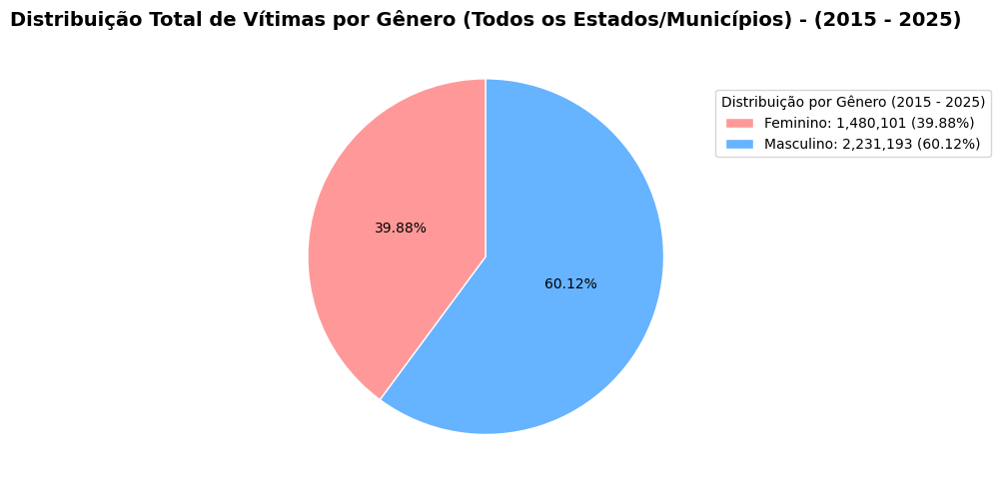

In [51]:
# 2.1 Distribuição Total de Vítimas por Gênero (Todos os Estados/Municípios) de 2015 a 2025
df_filtrado = df[df['Ano'] < 2026]

resultados_vitimas = df_filtrado.groupby("evento")[["feminino", "masculino"]].sum()
print("--- Total de Vítimas por Tipo de Evento ---")
print(resultados_vitimas.astype(int))

totais_vitimas = df_filtrado[['feminino', 'masculino']].sum()
total_geral_vitimas = totais_vitimas.sum()

labels_vitimas = [f'{genero}: {total:,.0f} ({(total/total_geral_vitimas)*100:.2f}%)' 
          for genero, total in zip(['Feminino', 'Masculino'], totais_vitimas)]

fig, ax = plt.subplots(figsize=(10, 5))

wedges, texts, autotexts = ax.pie(
    totais_vitimas, 
    autopct='%1.2f%%', 
    startangle=90, 
    colors=['#ff9999', '#66b3ff'], 
    pctdistance=0.5, 
    wedgeprops={'edgecolor': 'white'}
)

ax.legend(wedges, labels_vitimas, title="Distribuição por Gênero (2015 - 2025)", loc="center left", bbox_to_anchor=(1, 0.8), fontsize=10)

plt.title("Distribuição Total de Vítimas por Gênero (Todos os Estados/Municípios) - (2015 - 2025)", fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

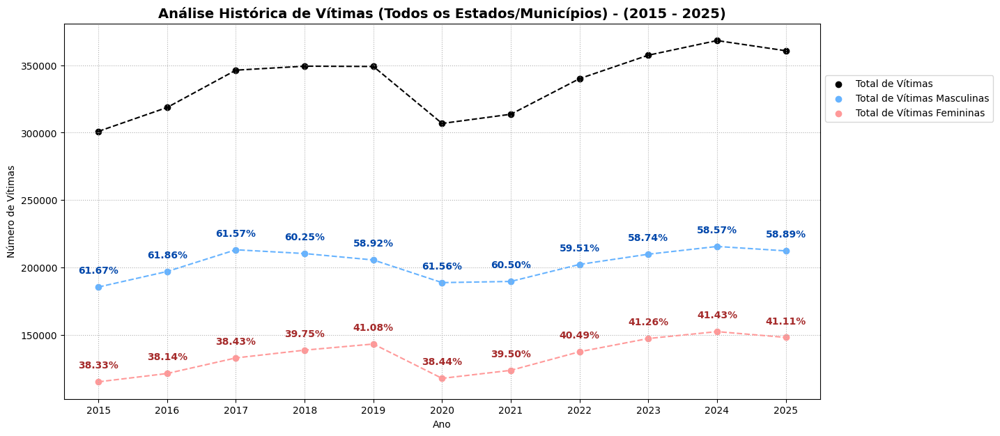

In [52]:
# 2.2 Análise Histórica de Vítimas (Todos os Estados/Municípios) de 2015 a 2025
df_anual = df.groupby('Ano')[['feminino', 'masculino']].sum().reset_index()
df_anual['total_vitimas'] = df_anual['feminino'] + df_anual['masculino']

df_anual['pct_masc'] = (df_anual['masculino'] / df_anual['total_vitimas']) * 100
df_anual['pct_fem'] = (df_anual['feminino'] / df_anual['total_vitimas']) * 100

df_historico = df_anual[df_anual['Ano'] < 2026]
anos_hist = df_historico['Ano']

plt.figure(figsize=(14, 7))

plt.scatter(anos_hist, df_historico['total_vitimas'], color='black', label='Total de Vítimas')
plt.scatter(anos_hist, df_historico['masculino'], color='#66b3ff', label='Total de Vítimas Masculinas')
plt.scatter(anos_hist, df_historico['feminino'], color='#ff9999', label='Total de Vítimas Femininas')

plt.plot(anos_hist, df_historico['total_vitimas'], color='black', linestyle='--')
plt.plot(anos_hist, df_historico['masculino'], color='#66b3ff', linestyle='--')
plt.plot(anos_hist, df_historico['feminino'], color='#ff9999', linestyle='--')

for i, ano in enumerate(anos_hist):
    plt.text(ano, df_historico['masculino'].iloc[i] + 10000, 
             f"{df_historico['pct_masc'].iloc[i]:.2f}%", 
             color='#0047ab', ha='center', fontsize=10, fontweight='bold')
    
    plt.text(ano, df_historico['feminino'].iloc[i] + 10000, 
             f"{df_historico['pct_fem'].iloc[i]:.2f}%", 
             color='#a52a2a', ha='center', fontsize=10, fontweight='bold')

plt.title('Análise Histórica de Vítimas (Todos os Estados/Municípios) - (2015 - 2025)', fontsize=14, fontweight='bold')
plt.xlabel('Ano')
plt.ylabel('Número de Vítimas')
plt.xticks(range(2015, 2026))
plt.legend(loc="center left", bbox_to_anchor=(1, 0.8), fontsize=10)
plt.grid(True, linestyle=':', alpha=1)

plt.show()

In [53]:
# 2.3 Distribuição de Vítimas por Gênero e Estado de 2015 a 2025
pio.renderers.default = 'notebook'
df_filtrado = df[df['Ano'] < 2026]

df_mapa = df_filtrado.groupby('uf').agg({
    'feminino': 'sum',
    'masculino': 'sum'
}).reset_index()

df_mapa['uf'] = df_mapa['uf'].astype(str).str.upper().str.strip()
df_mapa['total_vitimas'] = df_mapa['feminino'] + df_mapa['masculino']
df_mapa['perc_feminino'] = (df_mapa['feminino'] / df_mapa['total_vitimas'] * 100).round(2)
df_mapa['perc_masculino'] = (df_mapa['masculino'] / df_mapa['total_vitimas'] * 100).round(2)

url = "https://raw.githubusercontent.com/codeforamerica/click_that_hood/master/public/data/brazil-states.geojson"
geojson_br = requests.get(url).json()

fig = px.choropleth(
    df_mapa,
    geojson=geojson_br,
    locations='uf',
    featureidkey="properties.sigla",
    color='total_vitimas',
    hover_name='uf',
    hover_data={
        'uf': False,
        'total_vitimas': ':,',
        'feminino': ':,',
        'masculino': ':,',
        'perc_feminino': ':.2f',
        'perc_masculino': ':.2f'
    },
    title='<b>Distribuição de Vítimas por Gênero e Estado (2015 - 2025)</b>',
    color_continuous_scale="Reds",
    labels={
        'total_vitimas': 'Total de Vítimas',
        'feminino': 'Vítimas Fem.',
        'masculino': 'Vítimas Masc.',
        'perc_feminino': 'Feminino (%)',
        'perc_masculino': 'Masculino (%)'
    }
)

fig.update_geos(fitbounds="locations", visible=False)

fig.update_layout(
    margin={"r":0,"t":50,"l":0,"b":0},
    height=600,
    template="plotly_white"
)

fig.show()

In [54]:
# 2.4 Análise de Regressão
df_anual = df.groupby('Ano')[['feminino', 'masculino']].sum().reset_index()
df_anual['total_vitimas'] = df_anual['feminino'] + df_anual['masculino']

df_treino = df_anual[df_anual['Ano'] < 2026]

In [55]:
X = df_treino[['Ano']]

In [56]:
# Modelo para vítimas femininas
y_feminino = df_treino['feminino']

modelo_feminino = LinearRegression()
modelo_feminino.fit(X, y_feminino)

,"fit_intercept fit_intercept: bool, default=TrueWhether to calculate the intercept for this model. If setto False, no intercept will be used in calculations(i.e. data is expected to be centered).",True
,"copy_X copy_X: bool, default=TrueIf True, X will be copied; else, it may be overwritten.",True
,"tol tol: float, default=1e-6The precision of the solution (`coef_`) is determined by `tol` whichspecifies a different convergence criterion for the `lsqr` solver.`tol` is set as `atol` and `btol` of :func:`scipy.sparse.linalg.lsqr` whenfitting on sparse training data. This parameter has no effect when fittingon dense data... versionadded:: 1.7",1e-06
,"n_jobs n_jobs: int, default=NoneThe number of jobs to use for the computation. This will only providespeedup in case of sufficiently large problems, that is if firstly`n_targets > 1` and secondly `X` is sparse or if `positive` is setto `True`. ``None`` means 1 unless in a:obj:`joblib.parallel_backend` context. ``-1`` means using allprocessors. See :term:`Glossary ` for more details.",None
,"positive positive: bool, default=FalseWhen set to ``True``, forces the coefficients to be positive. Thisoption is only supported for dense arrays.For a comparison between a linear regression model with positive constraintson the regression coefficients and a linear regression without such constraints,see :ref:`sphx_glr_auto_examples_linear_model_plot_nnls.py`... versionadded:: 0.24",False


In [57]:
# Modelo para vítimas masculinas
y_masculino = df_treino['masculino']

modelo_masculino = LinearRegression()
modelo_masculino.fit(X, y_masculino)

,"fit_intercept fit_intercept: bool, default=TrueWhether to calculate the intercept for this model. If setto False, no intercept will be used in calculations(i.e. data is expected to be centered).",True
,"copy_X copy_X: bool, default=TrueIf True, X will be copied; else, it may be overwritten.",True
,"tol tol: float, default=1e-6The precision of the solution (`coef_`) is determined by `tol` whichspecifies a different convergence criterion for the `lsqr` solver.`tol` is set as `atol` and `btol` of :func:`scipy.sparse.linalg.lsqr` whenfitting on sparse training data. This parameter has no effect when fittingon dense data... versionadded:: 1.7",1e-06
,"n_jobs n_jobs: int, default=NoneThe number of jobs to use for the computation. This will only providespeedup in case of sufficiently large problems, that is if firstly`n_targets > 1` and secondly `X` is sparse or if `positive` is setto `True`. ``None`` means 1 unless in a:obj:`joblib.parallel_backend` context. ``-1`` means using allprocessors. See :term:`Glossary ` for more details.",None
,"positive positive: bool, default=FalseWhen set to ``True``, forces the coefficients to be positive. Thisoption is only supported for dense arrays.For a comparison between a linear regression model with positive constraintson the regression coefficients and a linear regression without such constraints,see :ref:`sphx_glr_auto_examples_linear_model_plot_nnls.py`... versionadded:: 0.24",False


In [58]:
# Modelo para o total
y_total = df_treino['total_vitimas']

modelo_total = LinearRegression()
modelo_total.fit(X, y_total)

,"fit_intercept fit_intercept: bool, default=TrueWhether to calculate the intercept for this model. If setto False, no intercept will be used in calculations(i.e. data is expected to be centered).",True
,"copy_X copy_X: bool, default=TrueIf True, X will be copied; else, it may be overwritten.",True
,"tol tol: float, default=1e-6The precision of the solution (`coef_`) is determined by `tol` whichspecifies a different convergence criterion for the `lsqr` solver.`tol` is set as `atol` and `btol` of :func:`scipy.sparse.linalg.lsqr` whenfitting on sparse training data. This parameter has no effect when fittingon dense data... versionadded:: 1.7",1e-06
,"n_jobs n_jobs: int, default=NoneThe number of jobs to use for the computation. This will only providespeedup in case of sufficiently large problems, that is if firstly`n_targets > 1` and secondly `X` is sparse or if `positive` is setto `True`. ``None`` means 1 unless in a:obj:`joblib.parallel_backend` context. ``-1`` means using allprocessors. See :term:`Glossary ` for more details.",None
,"positive positive: bool, default=FalseWhen set to ``True``, forces the coefficients to be positive. Thisoption is only supported for dense arrays.For a comparison between a linear regression model with positive constraintson the regression coefficients and a linear regression without such constraints,see :ref:`sphx_glr_auto_examples_linear_model_plot_nnls.py`... versionadded:: 0.24",False


In [59]:
anos_futuros = pd.DataFrame({'Ano': [2026, 2027, 2028, 2029, 2030]})

prev_2026_2030 = pd.DataFrame({
    'Ano': [2026, 2027, 2028, 2029, 2030],
    'Previsao_Feminino': modelo_feminino.predict(anos_futuros),
    'Previsao_Masculino': modelo_masculino.predict(anos_futuros),
    'Previsao_Total': modelo_total.predict(anos_futuros)
})

print(prev_2026_2030)

    Ano  Previsao_Feminino  Previsao_Masculino  Previsao_Total
0  2026      151464.000000       211909.145455   363373.145455
1  2027      154282.227273       213421.381818   367703.609091
2  2028      157100.454545       214933.618182   372034.072727
3  2029      159918.681818       216445.854545   376364.536364
4  2030      162736.909091       217958.090909   380695.000000


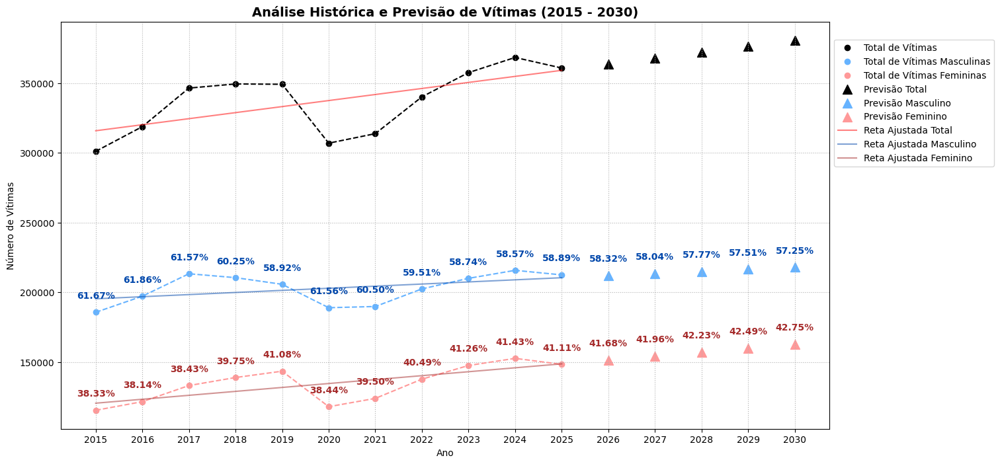

In [60]:
df_historico = df_anual[df_anual['Ano'] < 2026].copy()
anos_hist = df_historico['Ano']
anos_prev = prev_2026_2030['Ano']

df_historico['pct_masc'] = (df_historico['masculino'] / df_historico['total_vitimas']) * 100
df_historico['pct_fem'] = (df_historico['feminino'] / df_historico['total_vitimas']) * 100

prev_2026_2030['Previsao_pct_masc'] = (prev_2026_2030['Previsao_Masculino'] / prev_2026_2030['Previsao_Total']) * 100
prev_2026_2030['Previsao_pct_fem'] = (prev_2026_2030['Previsao_Feminino'] / prev_2026_2030['Previsao_Total']) * 100

plt.figure(figsize=(15, 8))

plt.scatter(anos_hist, df_historico['total_vitimas'], color='black', label='Total de Vítimas')
plt.scatter(anos_hist, df_historico['masculino'], color='#66b3ff', label='Total de Vítimas Masculinas')
plt.scatter(anos_hist, df_historico['feminino'], color='#ff9999', label='Total de Vítimas Femininas')

plt.scatter(anos_prev, prev_2026_2030['Previsao_Total'], color='black', marker='^', s=100, label='Previsão Total')
plt.scatter(anos_prev, prev_2026_2030['Previsao_Masculino'], color='#66b3ff', marker='^', s=100, label='Previsão Masculino')
plt.scatter(anos_prev, prev_2026_2030['Previsao_Feminino'], color='#ff9999', marker='^', s=100, label='Previsão Feminino')

plt.plot(anos_hist, df_historico['total_vitimas'], color='black', linestyle='--')
plt.plot(anos_hist, df_historico['masculino'], color='#66b3ff', linestyle='--')
plt.plot(anos_hist, df_historico['feminino'], color='#ff9999', linestyle='--')

for i, ano in enumerate(anos_hist):
    plt.text(ano, df_historico['masculino'].iloc[i] + 10000, 
             f"{df_historico['pct_masc'].iloc[i]:.2f}%", 
             color='#0047ab', ha='center', fontsize=10, fontweight='bold')
    
    plt.text(ano, df_historico['feminino'].iloc[i] + 10000, 
             f"{df_historico['pct_fem'].iloc[i]:.2f}%", 
             color='#a52a2a', ha='center', fontsize=10, fontweight='bold')

for i, ano in enumerate(anos_prev):
    plt.text(ano, prev_2026_2030['Previsao_Masculino'].iloc[i] + 10000, 
             f"{prev_2026_2030['Previsao_pct_masc'].iloc[i]:.2f}%", 
             color='#0047ab', ha='center', fontsize=10, fontweight='bold')
    
    plt.text(ano, prev_2026_2030['Previsao_Feminino'].iloc[i] + 10000, 
             f"{prev_2026_2030['Previsao_pct_fem'].iloc[i]:.2f}%", 
             color='#a52a2a', ha='center', fontsize=10, fontweight='bold')

y_pred_feminino = modelo_feminino.predict(X)
y_pred_masculino = modelo_masculino.predict(X)
y_pred_total = modelo_total.predict(X)

plt.plot(anos_hist, y_pred_total, color="red", alpha=0.5, label="Reta Ajustada Total")
plt.plot(anos_hist, y_pred_masculino, color="#0047ab", alpha=0.5, label="Reta Ajustada Masculino")
plt.plot(anos_hist, y_pred_feminino, color="#a52a2a", alpha=0.5, label="Reta Ajustada Feminino")

plt.title('Análise Histórica e Previsão de Vítimas (2015 - 2030)', fontsize=14, fontweight='bold')
plt.xlabel('Ano')
plt.ylabel('Número de Vítimas')
plt.xticks(range(2015, 2031))
plt.legend(loc="center left", bbox_to_anchor=(1, 0.8), fontsize=10)
plt.grid(True, linestyle=':', alpha=1)

plt.show()

In [61]:
# Validação Modelo Feminino
mae_feminino = mean_absolute_error(y_feminino, y_pred_feminino)
rmse_feminino = np.sqrt(mean_squared_error(y_feminino, y_pred_feminino))
r2_feminino = r2_score(y_feminino, y_pred_feminino)

print("--- Validação do Modelo Feminino ---")
print(f"MAE:  {mae_feminino:.6f}")
print(f"RMSE: {rmse_feminino:.6f}")
print(f"R²:   {r2_feminino:.6f}")
print("------------------------------------")
print(f"Intercepto: {modelo_feminino.intercept_:.2f}")
print(f"Coeficiente: {modelo_feminino.coef_[0]:.2f}")

--- Validação do Modelo Feminino ---
MAE:  7235.743802
RMSE: 8748.686451
R²:   0.509247
------------------------------------
Intercepto: -5558264.45
Coeficiente: 2818.23


In [62]:
# Validação Modelo Masculino
mae_masculino = mean_absolute_error(y_masculino, y_pred_masculino)
rmse_masculino = np.sqrt(mean_squared_error(y_masculino, y_pred_masculino))
r2_masculino = r2_score(y_masculino, y_pred_masculino)

print("--- Validação do Modelo Masculino ---")
print(f"MAE:  {mae_masculino:.6f}")
print(f"RMSE: {rmse_masculino:.6f}")
print(f"R²:   {r2_masculino:.6f}")
print("-------------------------------------")
print(f"Intercepto: {modelo_masculino.intercept_:.2f}")
print(f"Coeficiente: {modelo_masculino.coef_[0]:.2f}")

--- Validação do Modelo Masculino ---
MAE:  7575.533884
RMSE: 9166.619651
R²:   0.213934
-------------------------------------
Intercepto: -2851881.73
Coeficiente: 1512.24


In [63]:
# Validação Modelo Total
mae_total = mean_absolute_error(y_total, y_pred_total)
rmse_total = np.sqrt(mean_squared_error(y_total, y_pred_total))
r2_total = r2_score(y_total, y_pred_total)

print("--- Validação do Modelo Total ---")
print(f"MAE:  {mae_total:.6f}")
print(f"RMSE: {rmse_total:.6f}")
print(f"R²:   {r2_total:.6f}")
print("---------------------------------")
print(f"Intercepto: {modelo_total.intercept_:.2f}")
print(f"Coeficiente: {modelo_total.coef_[0]:.2f}")

--- Validação do Modelo Total ---
MAE:  14681.824793
RMSE: 17507.974009
R²:   0.379569
---------------------------------
Intercepto: -8410146.18
Coeficiente: 4330.46


--- Comparação de Desempenho (Base: Total de Vítimas) ---
             Modelo           MAE          RMSE        R²
0  Regressão_Linear  14681.824793  17507.974009  0.379569
1     Random_Forest   5337.658182   6898.010071  0.903690
2           XGBoost     75.289773    105.654936  0.999977

--- Previsões para 2026-2030 ---
    Ano  Previsao_Regressão_Linear  Previsao_Random_Forest  Previsao_XGBoost
0  2026              363373.145455               361630.35         360672.75
1  2027              367703.609091               361630.35         360672.75
2  2028              372034.072727               361630.35         360672.75
3  2029              376364.536364               361630.35         360672.75
4  2030              380695.000000               361630.35         360672.75


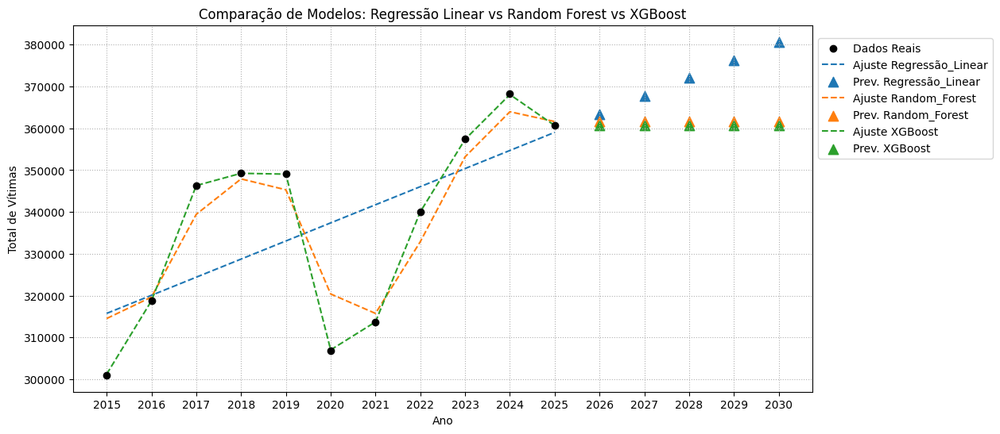

In [64]:
# 2.5 Comparação de Modelos: Regressão Linear vs Random Forest Regressor (Floresta Aleatória) vs XGBoost Regressor (Extreme Gradient Boosting)
# 1. Preparação dos dados
df_anual = df.groupby('Ano')[['feminino', 'masculino']].sum().reset_index()
df_anual['total_vitimas'] = df_anual['feminino'] + df_anual['masculino']
df_treino = df_anual[df_anual['Ano'] < 2026]

X = df_treino[['Ano']]
y_total = df_treino['total_vitimas']
anos_futuros = pd.DataFrame({'Ano': [2026, 2027, 2028, 2029, 2030]})

# 2. Definição dos modelos
modelos = {
    "Regressão_Linear": LinearRegression(),
    "Random_Forest": RandomForestRegressor(n_estimators=100, random_state=42),
    "XGBoost": XGBRegressor(n_estimators=100, learning_rate=0.1, random_state=42)
}

# 3. Treinamento, Previsão e Comparação de Métricas
resultados_metricas = []
previsoes_futuras = {"Ano": [2026, 2027, 2028, 2029, 2030]}

for nome, modelo in modelos.items():
    modelo.fit(X, y_total)
    
    y_pred = modelo.predict(X)
    
    mae = mean_absolute_error(y_total, y_pred)
    rmse = np.sqrt(mean_squared_error(y_total, y_pred))
    r2 = r2_score(y_total, y_pred)
    
    resultados_metricas.append({
        "Modelo": nome,
        "MAE": mae,
        "RMSE": rmse,
        "R²": r2
    })
    
    previsoes_futuras[f"Previsao_{nome}"] = modelo.predict(anos_futuros)

# 4. Exibição dos Resultados
df_comparacao = pd.DataFrame(resultados_metricas)
df_previsoes = pd.DataFrame(previsoes_futuras)

print("--- Comparação de Desempenho (Base: Total de Vítimas) ---")
print(df_comparacao)
print("\n--- Previsões para 2026-2030 ---")
print(df_previsoes)

plt.figure(figsize=(12, 6))
plt.scatter(df_treino['Ano'], y_total, color='black', label='Dados Reais', zorder=5)

for nome in modelos.keys():
    plt.plot(df_treino['Ano'], modelos[nome].predict(X), label=f'Ajuste {nome}', linestyle='--')
    plt.scatter(df_previsoes['Ano'], df_previsoes[f"Previsao_{nome}"], marker='^', s=80, label=f'Prev. {nome}')

plt.title('Comparação de Modelos: Regressão Linear vs Random Forest vs XGBoost')
plt.xlabel('Ano')
plt.ylabel('Total de Vítimas')
plt.xticks(range(2015, 2031))
plt.legend(loc="center left", bbox_to_anchor=(1, 0.8), fontsize=10)
plt.grid(True, linestyle=':', alpha=1)
plt.show()

## 3. Análise da Quantidade de Armas apreendidas por Tipo

--- Total de Armas de Fogo Apreendidas por Tipo de Arma ---
arma
Revolver           464417
Pistola            255551
Espingarda         254782
Outra              166499
Carabina            25331
Fuzil               13796
Rifle                9819
Submetralhadora      5657
Metralhadora         2689
Name: total, dtype: int64


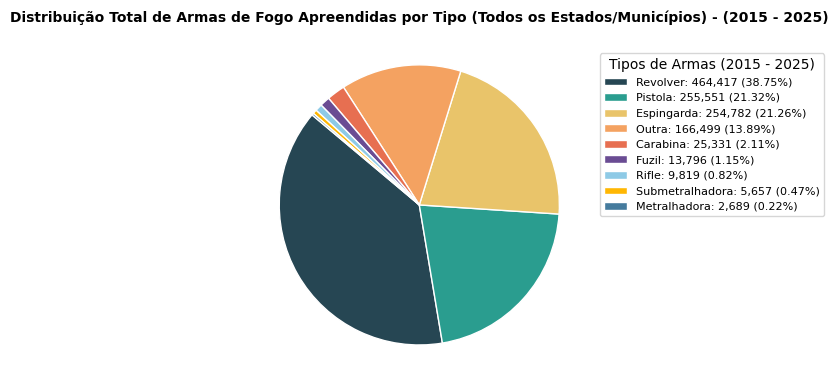

In [65]:
# 3.1 Distribuição Total de Armas de Fogo Apreendidas por Tipo (Todos os Estados/Municípios) de 2015 a 2025
df_filtrado = df[df['Ano'] < 2026]

armas_fogo = df_filtrado[df_filtrado['evento'] == 'Arma de Fogo Apreendida']
resultado_armas = armas_fogo.groupby('arma')['total'].sum().sort_values(ascending=False)
print("--- Total de Armas de Fogo Apreendidas por Tipo de Arma ---")
print(resultado_armas.astype(int))

total_geral_armas = resultado_armas.sum()

labels_armas = [f'{arma}: {valor:,.0f} ({(valor/total_geral_armas)*100:.2f}%)' for arma, valor in resultado_armas.items()]

fig, ax = plt.subplots(figsize=(8, 4))

cores_armas = [
    '#264653', # Azul Petróleo Escuro
    '#2a9d8f', # Verde Água
    '#e9c46a', # Amarelo Queimado
    '#f4a261', # Laranja Suave
    '#e76f51', # Terracota
    '#6a4c93', # Roxo Médio
    '#8ecae6', # Azul Céu
    '#ffb703', # Dourado
    '#457b9d'  # Azul Oceano
]

wedges, texts = ax.pie(
    resultado_armas, 
    startangle=140, 
    colors=cores_armas, 
    pctdistance=0.85, 
    wedgeprops={'edgecolor': 'white', 'linewidth': 1}
)

ax.legend(wedges, labels_armas, title="Tipos de Armas (2015 - 2025)", loc="center left", bbox_to_anchor=(1, 0.7), fontsize=8)

plt.title("Distribuição Total de Armas de Fogo Apreendidas por Tipo (Todos os Estados/Municípios) - (2015 - 2025)", 
          fontsize=10,
          fontweight='bold')
plt.tight_layout()
plt.show()

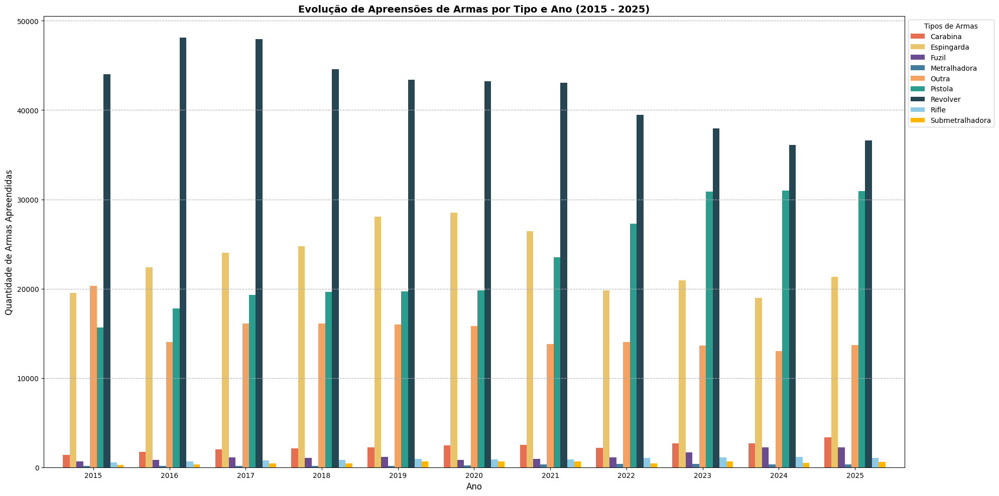

In [66]:
# 3.2 - Evolução de Apreensões de Armas por Tipo e Ano de 2015 a 2025
df_agrupado = armas_fogo.groupby(['Ano', 'arma'])['total'].sum().unstack(fill_value=0)

mapa_cores_fixas_armas = {
    'Revolver': '#264653',          # Azul Petróleo Escuro
    'Pistola': '#2a9d8f',           # Verde Água
    'Espingarda': '#e9c46a',        # Amarelo Queimado
    'Outra': '#f4a261',             # Laranja Suave
    'Carabina': '#e76f51',          # Terracota
    'Fuzil': '#6a4c93',             # Roxo Médio
    'Rifle': '#8ecae6',             # Azul Céu
    'Submetralhadora': '#ffb703',   # Dourado
    'Metralhadora': '#457b9d',      # Azul Oceano
    'nan': '#cccccc'                # Cinza para valores nulos
}
cores_lista = [mapa_cores_fixas_armas.get(str(col), '#cccccc') for col in df_agrupado.columns]

fig, ax = plt.subplots(figsize=(20, 10))

df_agrupado.plot(kind='bar', ax=ax, color=cores_lista, width=0.8)

plt.title("Evolução de Apreensões de Armas por Tipo e Ano (2015 - 2025)", fontsize=14, fontweight='bold')
plt.xlabel("Ano", fontsize=12)
plt.ylabel("Quantidade de Armas Apreendidas", fontsize=12)
plt.xticks(rotation=360)
plt.grid(axis='y', linestyle='--', alpha=1)

plt.legend(title="Tipos de Armas", bbox_to_anchor=(1, 1), loc='upper left')

plt.tight_layout()
plt.show()

In [67]:
# 3.3 - Análise Espacial da Apreensão de Armas de Fogo por Estado de 2015 a 2025
pio.renderers.default = 'notebook'
df_filtrado = df[df['Ano'] < 2026]
df_armas = df_filtrado[df_filtrado['evento'] == 'Arma de Fogo Apreendida'].copy()

df_mapa_armas = df_armas.pivot_table(
    index='uf', 
    columns='arma', 
    values='total', 
    aggfunc='sum', 
    fill_value=0
).reset_index()

df_mapa_armas['uf'] = df_mapa_armas['uf'].astype(str).str.upper().str.strip()
colunas_armas = df_mapa_armas.columns[1:]
df_mapa_armas['total_armas'] = df_mapa_armas[colunas_armas].sum(axis=1)

for arma in colunas_armas:
    df_mapa_armas[f'{arma} (%)'] = (df_mapa_armas[arma] / df_mapa_armas['total_armas'] * 100).round(2)

url = "https://raw.githubusercontent.com/codeforamerica/click_that_hood/master/public/data/brazil-states.geojson"
geojson_br = requests.get(url).json()

hover_dict = {'uf': False, 'total_armas': ':,'}
for arma in colunas_armas:
    hover_dict[arma] = ':,'
    hover_dict[f'{arma} (%)'] = ':.2f'

fig = px.choropleth(
    df_mapa_armas,
    geojson=geojson_br,
    locations='uf',
    featureidkey="properties.sigla",
    color='total_armas',
    hover_name='uf',
    hover_data=hover_dict,
    title='<b>Análise Espacial: Apreensão de Armas de Fogo por Estado (2015 - 2025)</b>',
    color_continuous_scale="Viridis",
    labels={'total_armas': 'Total de Armas'}
)

fig.update_geos(fitbounds="locations", visible=False)

fig.update_layout(
    margin={"r":0,"t":50,"l":0,"b":0},
    height=600,
    template="plotly_white"
)

fig.show()

## 4. Análise de Risco de Morte por Tipo de Agente

Os eventos analisados nesta secao sao **"Morte de Agente do Estado"** e **"Suicidio de Agente do Estado"**, utilizando a coluna `total_vitima` como metrica principal e a coluna `agente` para identificar o tipo de agente.

Os tipos de agentes presentes nos dados sao: Policia Militar, Policia Civil, Policia Penal, Bombeiro Militar, Guarda Municipal, PRF, PF, Agente de Transito e Profissionais de Pericia.

In [68]:
# Filtrar eventos de morte e suicidio de agentes do Estado
eventos_agente = ['Morte de Agente do Estado', 'Suicídio de Agente do Estado']
df_agentes = df[df['evento'].isin(eventos_agente)].copy()

# Remover ano 2026 (dados incompletos)
df_agentes = df_agentes[df_agentes['Ano'] < 2026]

print(f'Total de registros de morte/suicidio de agentes: {len(df_agentes):,}')
print(f'Eventos: {df_agentes["evento"].unique()}')
print(f'Tipos de agentes: {df_agentes["agente"].dropna().unique()}')
print(f'Anos: {sorted(df_agentes["Ano"].dropna().unique())}')

Total de registros de morte/suicidio de agentes: 63,876
Eventos: ['Morte de Agente do Estado' 'Suicídio de Agente do Estado']
Tipos de agentes: ['PRF' 'Polícia Penal' 'Agente de Trânsito' 'Bombeiro Militar'
 'Guarda Municipal' 'Polícia Civil' 'Polícia Militar'
 'Profissionais de Perícia' 'PF']
Anos: [np.int64(2015), np.int64(2016), np.int64(2017), np.int64(2018), np.int64(2019), np.int64(2020), np.int64(2021), np.int64(2022), np.int64(2023), np.int64(2024), np.int64(2025)]


#### 4.1 Risco de morte por tipo de agente em cada Estado/Ano

In [69]:
mortes_estado_agente_ano = (
    df_agentes
    .groupby(['uf', 'agente', 'Ano'])['total_vitima']
    .sum()
    .reset_index()
)

mortes_estado_agente_ano = mortes_estado_agente_ano[mortes_estado_agente_ano['total_vitima'] > 0]

mortes_estado_agente_ano.head(10)

,uf,agente,Ano,total_vitima
17,AC,Bombeiro Militar,2021,1.0
41,AC,PF,2023,1.0
42,AC,PF,2024,1.0
55,AC,Polícia Civil,2015,1.0
60,AC,Polícia Civil,2020,1.0
66,AC,Polícia Militar,2015,3.0
67,AC,Polícia Militar,2016,3.0
70,AC,Polícia Militar,2019,2.0
71,AC,Polícia Militar,2020,1.0
72,AC,Polícia Militar,2021,1.0


In [70]:
mortes_por_estado_agente = (
    df_agentes
    .groupby(['uf', 'agente'])['total_vitima']
    .sum()
    .reset_index()
)

agente_mais_mortes_estado = (
    mortes_por_estado_agente
    .sort_values(['uf', 'total_vitima'], ascending=[True, False])
    .groupby('uf')
    .first()
    .reset_index()
)

agente_mais_mortes_estado

,uf,agente,total_vitima
0,AC,Polícia Militar,14.0
1,AL,Polícia Militar,66.0
2,AM,Polícia Militar,68.0
3,AP,Polícia Militar,10.0
4,BA,Polícia Militar,149.0
5,CE,Polícia Militar,174.0
6,DF,Polícia Militar,30.0
7,ES,Polícia Militar,33.0
8,GO,Polícia Militar,34.0
9,MA,Polícia Militar,76.0


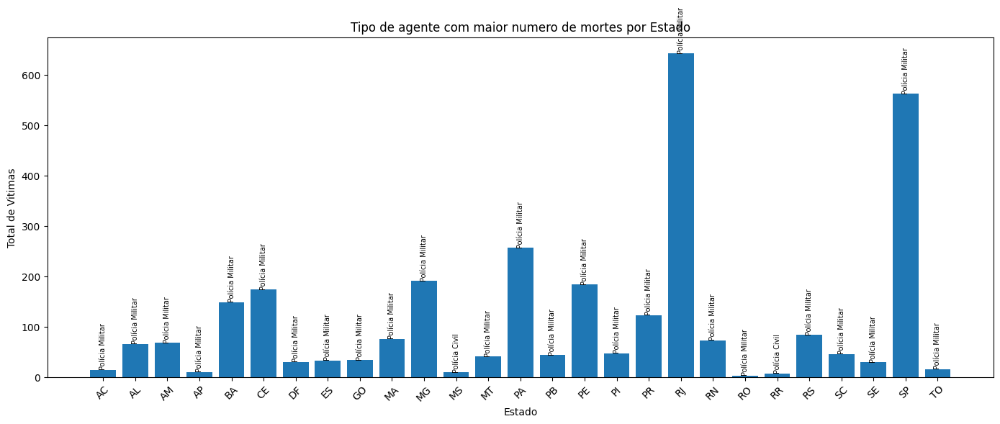

In [71]:
plt.figure(figsize=(14, 6))

bars = plt.bar(agente_mais_mortes_estado['uf'], agente_mais_mortes_estado['total_vitima'])

for i, row in agente_mais_mortes_estado.iterrows():
    plt.text(i, row['total_vitima'], row['agente'], rotation=90, ha='center', va='bottom', fontsize=7)

plt.title('Tipo de agente com maior numero de mortes por Estado')
plt.xlabel('Estado')
plt.ylabel('Total de Vitimas')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

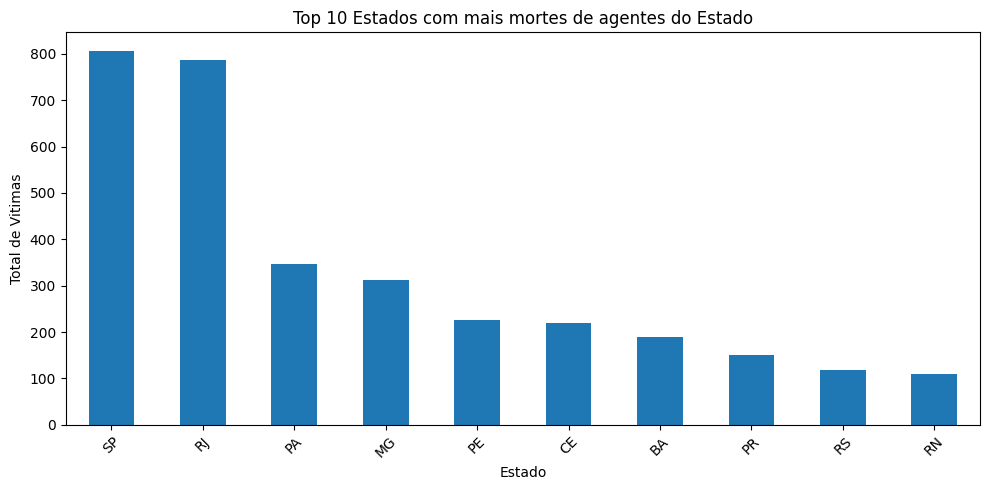

In [72]:
mortes_total_estado = (
    df_agentes
    .groupby('uf')['total_vitima']
    .sum()
    .sort_values(ascending=False)
)

plt.figure(figsize=(10, 5))
mortes_total_estado.head(10).plot(kind='bar')
plt.title('Top 10 Estados com mais mortes de agentes do Estado')
plt.xlabel('Estado')
plt.ylabel('Total de Vitimas')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

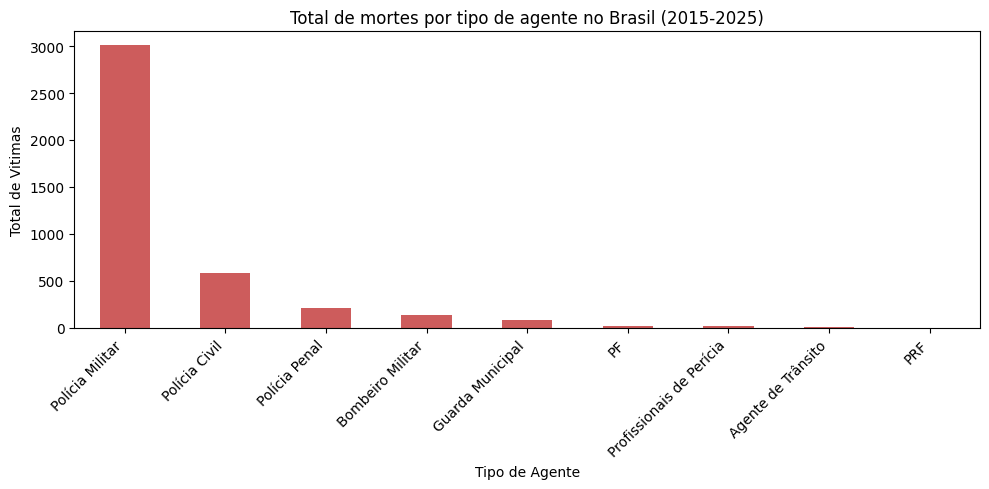

agente
Polícia Militar             3006.0
Polícia Civil                580.0
Polícia Penal                214.0
Bombeiro Militar             142.0
Guarda Municipal              86.0
PF                            23.0
Profissionais de Perícia      19.0
Agente de Trânsito             5.0
PRF                            0.0
Name: total_vitima, dtype: float64

In [73]:
mortes_por_agente = (
    df_agentes
    .groupby('agente')['total_vitima']
    .sum()
    .sort_values(ascending=False)
)

plt.figure(figsize=(10, 5))
mortes_por_agente.plot(kind='bar', color='indianred')
plt.title('Total de mortes por tipo de agente no Brasil (2015-2025)')
plt.xlabel('Tipo de Agente')
plt.ylabel('Total de Vitimas')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

mortes_por_agente

#### 4.2 Total de mortes de agentes no Brasil por ano

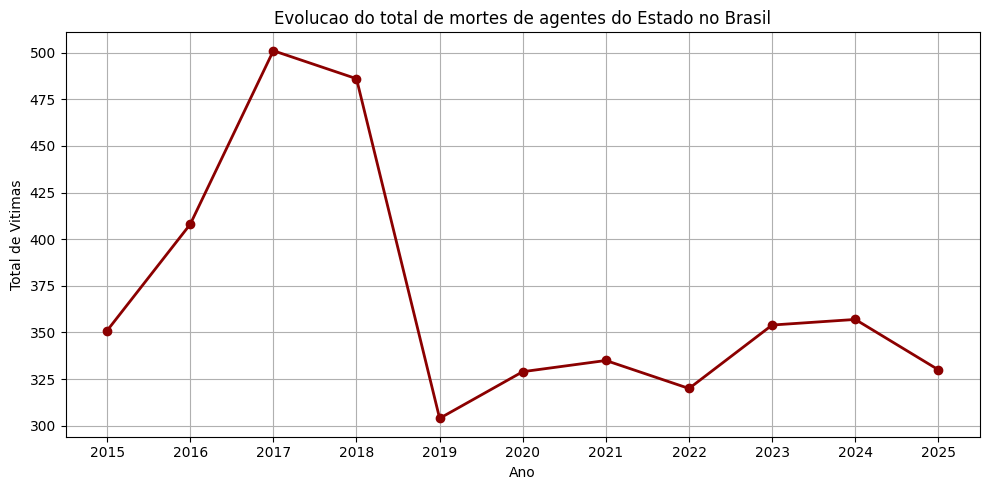

Ano
2015    351.0
2016    408.0
2017    501.0
2018    486.0
2019    304.0
2020    329.0
2021    335.0
2022    320.0
2023    354.0
2024    357.0
2025    330.0
Name: total_vitima, dtype: float64

In [74]:
mortes_brasil_ano = df_agentes.groupby('Ano')['total_vitima'].sum()

plt.figure(figsize=(10, 5))
mortes_brasil_ano.plot(marker='o', linewidth=2, color='darkred')
plt.title('Evolucao do total de mortes de agentes do Estado no Brasil')
plt.xlabel('Ano')
plt.ylabel('Total de Vitimas')
plt.grid(True)
plt.xticks(mortes_brasil_ano.index.astype(int))
plt.tight_layout()
plt.show()

mortes_brasil_ano

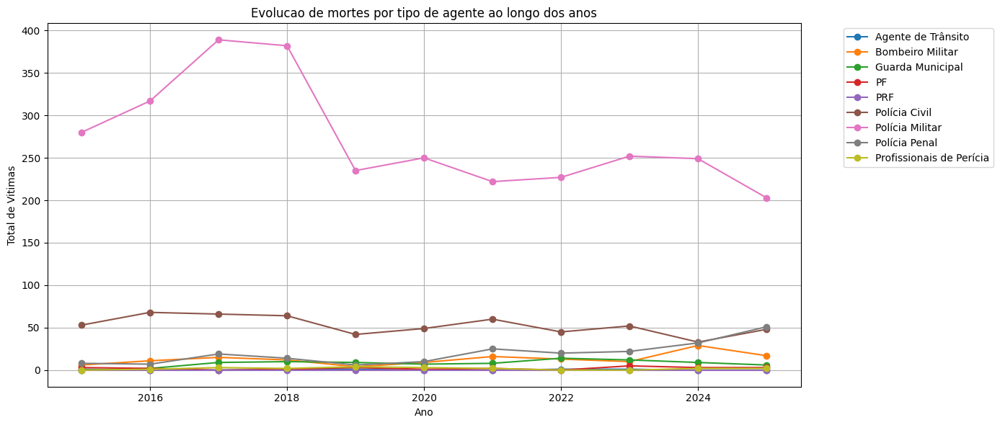

In [75]:
mortes_agente_ano = (
    df_agentes
    .groupby(['Ano', 'agente'])['total_vitima']
    .sum()
    .reset_index()
)

tabela_agente_ano = mortes_agente_ano.pivot(index='Ano', columns='agente', values='total_vitima').fillna(0)

tabela_agente_ano.plot(figsize=(14, 6), marker='o')
plt.title('Evolucao de mortes por tipo de agente ao longo dos anos')
plt.xlabel('Ano')
plt.ylabel('Total de Vitimas')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()

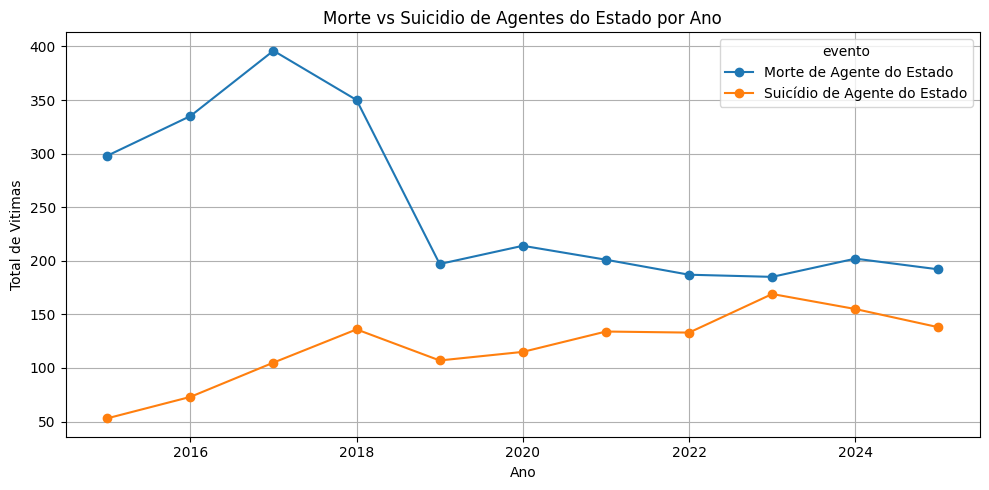

evento,Morte de Agente do Estado,Suicídio de Agente do Estado
Ano,,
2015,298.0,53.0
2016,335.0,73.0
2017,396.0,105.0
2018,350.0,136.0
2019,197.0,107.0
2020,214.0,115.0
2021,201.0,134.0
2022,187.0,133.0
2023,185.0,169.0


In [76]:
# Separar analise por tipo de evento: Morte vs Suicidio
mortes_evento_ano = (
    df_agentes
    .groupby(['Ano', 'evento'])['total_vitima']
    .sum()
    .reset_index()
)

tabela_evento_ano = mortes_evento_ano.pivot(index='Ano', columns='evento', values='total_vitima').fillna(0)

tabela_evento_ano.plot(figsize=(10, 5), marker='o')
plt.title('Morte vs Suicidio de Agentes do Estado por Ano')
plt.xlabel('Ano')
plt.ylabel('Total de Vitimas')
plt.grid(True)
plt.tight_layout()
plt.show()

tabela_evento_ano

#### 4.3 Analise de Regressao: previsao de aumento ou diminuicao de mortes de agentes por Estado e tipo de agente

In [77]:
dados_brasil = mortes_brasil_ano.reset_index()
dados_brasil.columns = ['Ano', 'total_vitima']

X = dados_brasil[['Ano']]
y = dados_brasil['total_vitima']

modelo_brasil = LinearRegression()
modelo_brasil.fit(X, y)

previsao_2027 = modelo_brasil.predict(pd.DataFrame({'Ano': [2027]}))[0]

print(f'Coeficiente (inclinacao): {modelo_brasil.coef_[0]:.2f}')
print(f'Intercepto: {modelo_brasil.intercept_:.2f}')
print(f'Previsao para 2027: {previsao_2027:.0f} mortes')

y_pred = modelo_brasil.predict(X)
r2 = r2_score(y, y_pred)
print(f'R2: {r2:.4f}')

Coeficiente (inclinacao): -9.55
Intercepto: 19670.64
Previsao para 2027: 304 mortes
R2: 0.2272


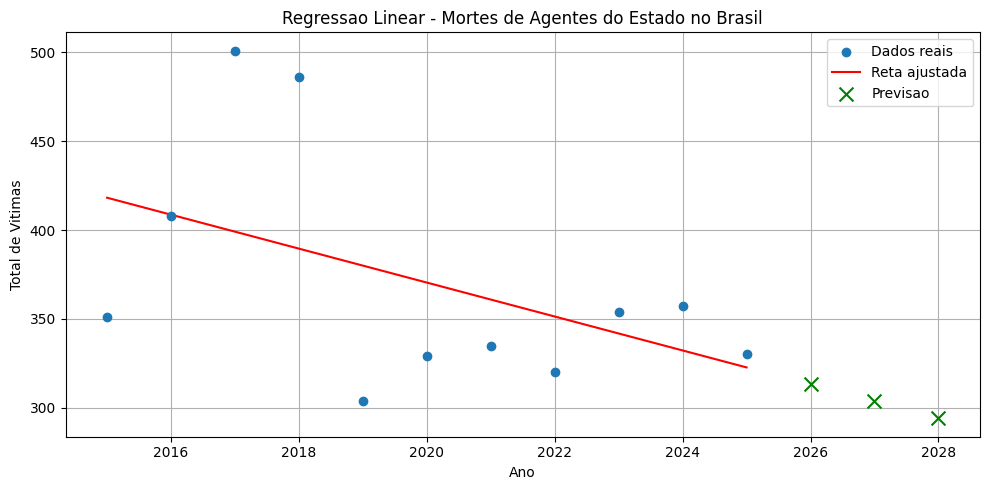

In [78]:
plt.figure(figsize=(10, 5))
plt.scatter(dados_brasil['Ano'], dados_brasil['total_vitima'], label='Dados reais', zorder=5)
plt.plot(dados_brasil['Ano'], y_pred, color='red', label='Reta ajustada')

# Previsao futura
anos_futuros = pd.DataFrame({'Ano': [2026, 2027, 2028]})
prev_futuros = modelo_brasil.predict(anos_futuros)
plt.scatter(anos_futuros['Ano'], prev_futuros, color='green', marker='x', s=100, label='Previsao', zorder=5)

plt.title('Regressao Linear - Mortes de Agentes do Estado no Brasil')
plt.xlabel('Ano')
plt.ylabel('Total de Vitimas')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [79]:
# Regressao por Estado: tendencia de mortes de agentes
resultados_agentes = []

for estado in df_agentes['uf'].unique():
    dados_est = (
        df_agentes[df_agentes['uf'] == estado]
        .groupby('Ano')['total_vitima']
        .sum()
        .reset_index()
    )
    
    if len(dados_est) > 1:
        X = dados_est[['Ano']]
        y = dados_est['total_vitima']
        
        modelo = LinearRegression()
        modelo.fit(X, y)
        
        coef = modelo.coef_[0]
        previsao_2027 = modelo.predict(pd.DataFrame({'Ano': [2027]}))[0]
        
        if coef > 0:
            tendencia = 'Aumento'
        elif coef < 0:
            tendencia = 'Diminuicao'
        else:
            tendencia = 'Estavel'
        
        resultados_agentes.append([estado, coef, previsao_2027, tendencia])

df_tendencia_estado = pd.DataFrame(
    resultados_agentes, 
    columns=['Estado', 'Coeficiente', 'Previsao_2027', 'Tendencia']
)

df_tendencia_estado.sort_values('Coeficiente', ascending=False)

,Estado,Coeficiente,Previsao_2027,Tendencia
22,RS,2.481818,28.100000,Aumento
26,TO,0.445455,5.390909,Aumento
8,GO,0.436364,6.963636,Aumento
11,MS,0.263636,3.300000,Aumento
2,AM,0.218182,7.981818,Aumento
20,RO,0.136364,1.318182,Aumento
14,PB,0.118182,7.372727,Aumento
3,AP,0.081818,2.572727,Aumento
12,MT,0.045455,5.772727,Aumento
6,DF,0.027273,5.100000,Aumento


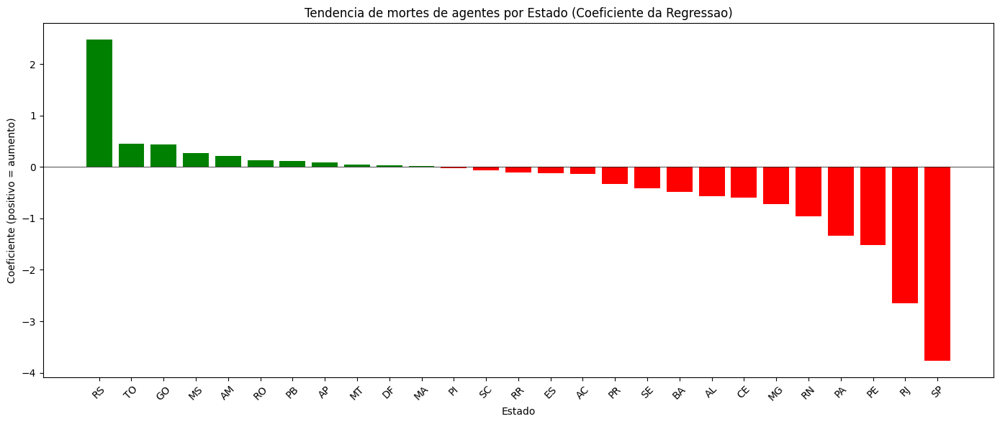

In [80]:
df_tend_sorted = df_tendencia_estado.sort_values('Coeficiente', ascending=False)

cores = ['green' if c > 0 else 'red' if c < 0 else 'gray' for c in df_tend_sorted['Coeficiente']]

plt.figure(figsize=(14, 6))
plt.bar(df_tend_sorted['Estado'], df_tend_sorted['Coeficiente'], color=cores)
plt.title('Tendencia de mortes de agentes por Estado (Coeficiente da Regressao)')
plt.xlabel('Estado')
plt.ylabel('Coeficiente (positivo = aumento)')
plt.xticks(rotation=45)
plt.axhline(y=0, color='black', linewidth=0.5)
plt.tight_layout()
plt.show()

In [81]:
resultados_estado_agente = []

for estado in df_agentes['uf'].unique():
    for agente in df_agentes['agente'].dropna().unique():
        dados_ea = (
            df_agentes[
                (df_agentes['uf'] == estado) &
                (df_agentes['agente'] == agente)
            ]
            .groupby('Ano')['total_vitima']
            .sum()
            .reset_index()
        )
        
        if len(dados_ea) > 1:
            X = dados_ea[['Ano']]
            y = dados_ea['total_vitima']
            
            modelo = LinearRegression()
            modelo.fit(X, y)
            
            coef = modelo.coef_[0]
            previsao_2027 = modelo.predict(pd.DataFrame({'Ano': [2027]}))[0]
            
            if coef > 0:
                tendencia = 'Aumento'
            elif coef < 0:
                tendencia = 'Diminuicao'
            else:
                tendencia = 'Estavel'
            
            resultados_estado_agente.append([estado, agente, coef, previsao_2027, tendencia])

df_tend_estado_agente = pd.DataFrame(
    resultados_estado_agente,
    columns=['Estado', 'Agente', 'Coeficiente', 'Previsao_2027', 'Tendencia']
)

df_tend_estado_agente.head(10)

,Estado,Agente,Coeficiente,Previsao_2027,Tendencia
0,AC,PRF,0.000000,0.000000,Estavel
1,AC,Polícia Penal,-0.054545,0.163636,Diminuicao
2,AC,Agente de Trânsito,0.000000,0.000000,Estavel
3,AC,Bombeiro Militar,0.009091,0.154545,Aumento
4,AC,Guarda Municipal,0.000000,0.000000,Estavel
5,AC,Polícia Civil,-0.045455,-0.136364,Diminuicao
6,AC,Polícia Militar,-0.109091,0.509091,Diminuicao
7,AC,Profissionais de Perícia,0.000000,0.000000,Estavel
8,AC,PF,0.063636,0.627273,Aumento
9,AL,PRF,0.000000,0.000000,Estavel


In [82]:
# maior tendencia de aumento em cada Estado
aumento_agente_estado = (
    df_tend_estado_agente[df_tend_estado_agente['Coeficiente'] > 0]
    .sort_values(by='Coeficiente', ascending=False)
    .groupby('Estado')
    .first()
    .reset_index()
)

# maior tendencia de diminuicao em cada Estado
diminuicao_agente_estado = (
    df_tend_estado_agente[df_tend_estado_agente['Coeficiente'] < 0]
    .sort_values(by='Coeficiente', ascending=True)
    .groupby('Estado')
    .first()
    .reset_index()
)

# Tabela resumo
resumo_agentes = aumento_agente_estado[['Estado', 'Agente', 'Coeficiente']].merge(
    diminuicao_agente_estado[['Estado', 'Agente', 'Coeficiente']],
    on='Estado',
    how='outer',
    suffixes=('_Aumento', '_Diminuicao')
)

resumo_agentes

,Estado,Agente_Aumento,Coeficiente_Aumento,Agente_Diminuicao,Coeficiente_Diminuicao
0,AC,PF,0.063636,Polícia Militar,-1.090909e-01
1,AL,Bombeiro Militar,0.127273,Polícia Militar,-6.818182e-01
2,AM,Polícia Militar,0.218182,Polícia Civil,-5.292781e-18
3,AP,Polícia Penal,0.072727,Guarda Municipal,-2.727273e-02
4,BA,Guarda Municipal,0.154545,Polícia Militar,-5.090909e-01
5,CE,Guarda Municipal,0.109091,Polícia Militar,-6.090909e-01
6,DF,Polícia Penal,0.136364,Bombeiro Militar,-7.272727e-02
7,ES,Polícia Penal,0.109091,Polícia Militar,-3.818182e-01
8,GO,Polícia Militar,0.281818,NaN,NaN
9,MA,Polícia Militar,0.090909,Bombeiro Militar,-6.363636e-02


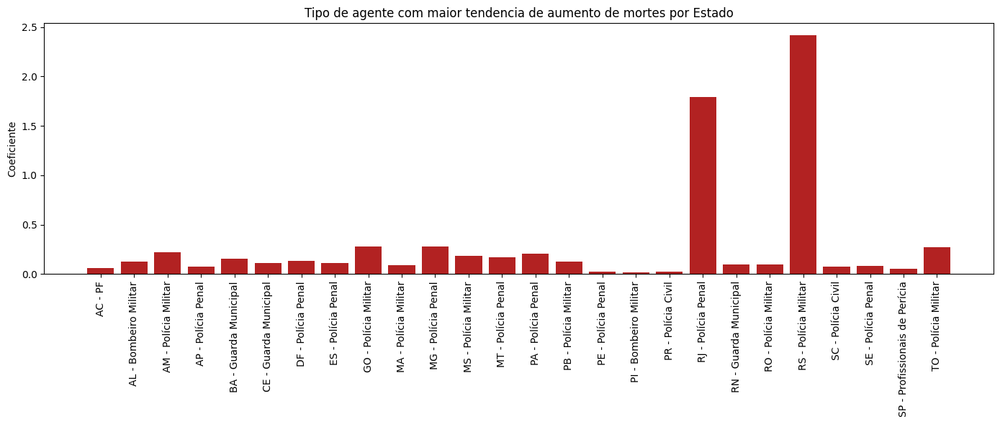

In [83]:
# Grafico: maior aumento de mortes por Estado
if len(aumento_agente_estado) > 0:
    aumento_agente_estado['descricao'] = aumento_agente_estado['Estado'] + ' - ' + aumento_agente_estado['Agente']

    plt.figure(figsize=(14, 6))
    plt.bar(aumento_agente_estado['descricao'], aumento_agente_estado['Coeficiente'], color='firebrick')
    plt.title('Tipo de agente com maior tendencia de aumento de mortes por Estado')
    plt.ylabel('Coeficiente')
    plt.xticks(rotation=90)
    plt.tight_layout()
    plt.show()

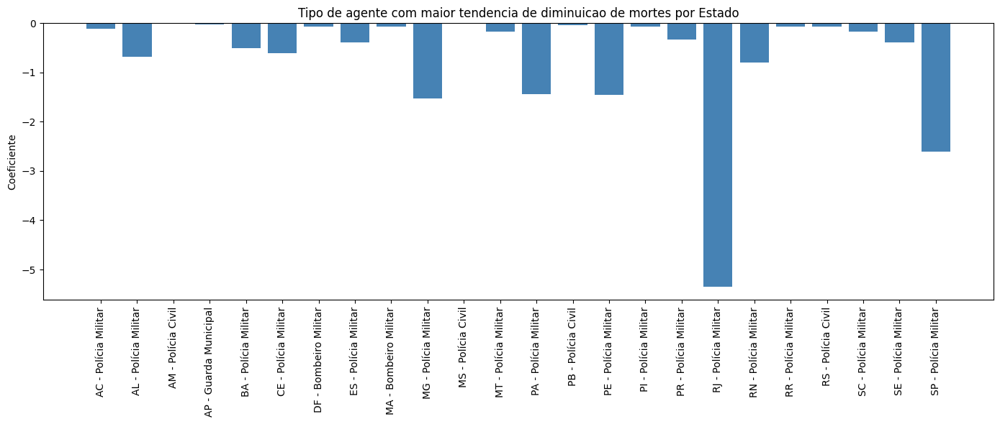

In [84]:
# Grafico: Agente com maior diminuicao de mortes por Estado
if len(diminuicao_agente_estado) > 0:
    diminuicao_agente_estado['descricao'] = diminuicao_agente_estado['Estado'] + ' - ' + diminuicao_agente_estado['Agente']

    plt.figure(figsize=(14, 6))
    plt.bar(diminuicao_agente_estado['descricao'], diminuicao_agente_estado['Coeficiente'], color='steelblue')
    plt.title('Tipo de agente com maior tendencia de diminuicao de mortes por Estado')
    plt.ylabel('Coeficiente')
    plt.xticks(rotation=90)
    plt.tight_layout()
    plt.show()

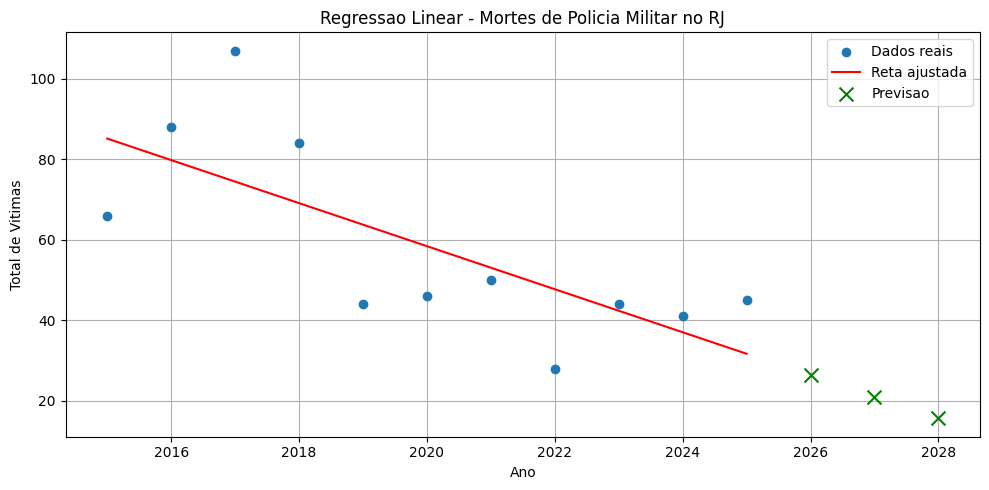

Coeficiente: -5.35
Previsao 2027: 21


In [85]:
# Exemplo detalhado: Regressao para Policia Militar no RJ
df_exemplo_ag = df_agentes[
    (df_agentes['uf'] == 'RJ') &
    (df_agentes['agente'] == 'Polícia Militar')
]

dados_ex = df_exemplo_ag.groupby('Ano')['total_vitima'].sum().reset_index()

X_ex = dados_ex[['Ano']]
y_ex = dados_ex['total_vitima']

modelo_ex = LinearRegression()
modelo_ex.fit(X_ex, y_ex)

y_pred_ex = modelo_ex.predict(X_ex)

plt.figure(figsize=(10, 5))
plt.scatter(dados_ex['Ano'], dados_ex['total_vitima'], label='Dados reais', zorder=5)
plt.plot(dados_ex['Ano'], y_pred_ex, color='red', label='Reta ajustada')

prev_2027 = modelo_ex.predict(pd.DataFrame({'Ano': [2026, 2027, 2028]}))
plt.scatter([2026, 2027, 2028], prev_2027, color='green', marker='x', s=100, label='Previsao', zorder=5)

plt.title('Regressao Linear - Mortes de Policia Militar no RJ')
plt.xlabel('Ano')
plt.ylabel('Total de Vitimas')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

print(f'Coeficiente: {modelo_ex.coef_[0]:.2f}')
print(f'Previsao 2027: {modelo_ex.predict(pd.DataFrame({"Ano": [2027]}))[0]:.0f}')

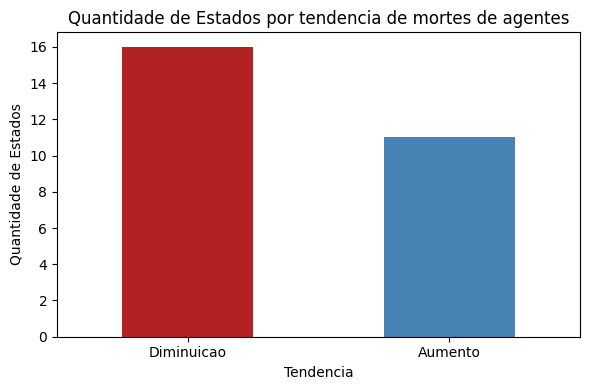

Tendencia
Diminuicao    16
Aumento       11
Name: count, dtype: int64


In [86]:
# Resumo: contagem de estados com aumento vs diminuicao
contagem_tend = df_tendencia_estado['Tendencia'].value_counts()

plt.figure(figsize=(6, 4))
contagem_tend.plot(kind='bar', color=['firebrick', 'steelblue', 'gray'])
plt.title('Quantidade de Estados por tendencia de mortes de agentes')
plt.xlabel('Tendencia')
plt.ylabel('Quantidade de Estados')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

print(contagem_tend)

#### Conclusao da Seção 4

- A **Policia Militar** e o tipo de agente com o maior numero de mortes em praticamente todos os Estados, tanto por morte em servico quanto por suicidio.
- O **Rio de Janeiro** e **Sao Paulo** lideram o ranking de mortes de agentes do Estado.
- A analise de regressao linear por Estado permite identificar tendencias de aumento ou diminuicao nas mortes, auxiliando na previsao para anos futuros.
- A tabela de resumo por Estado e tipo de agente mostra quais combinacoes apresentam tendencia de crescimento (coeficiente positivo) ou reducao (coeficiente negativo) no numero de mortes.
- E importante ressaltar que a regressao linear e uma aproximacao simples e que fatores externos (politicas publicas, investimento em seguranca, etc.) influenciam diretamente esses numeros.

## 5. Análise da Quantidade de Drogas apreendidas (total_peso)

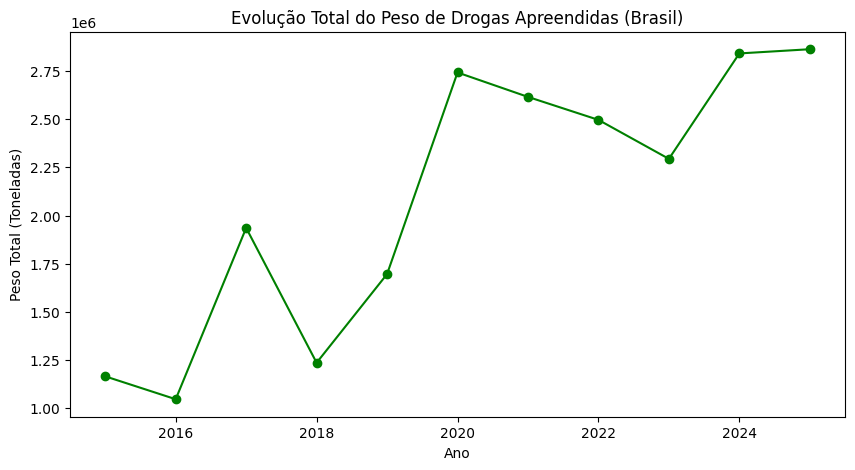

In [87]:
# Filtrar registros de apreensão de drogas com peso informado
df_drogas = df[df['evento'].str.contains('Apreensão', na=False) & df['total_peso'].notnull()].copy()

drogas_ano = df_drogas.groupby('Ano')['total_peso'].sum().reset_index()

plt.figure(figsize=(10,5))
plt.plot(drogas_ano['Ano'], drogas_ano['total_peso'], marker='o', linestyle='-', color='green')
plt.title('Evolução Total do Peso de Drogas Apreendidas (Brasil)')
plt.xlabel('Ano')
plt.ylabel('Peso Total (Toneladas)')
plt.show()

- 2026 está muito abaixo por estarmos apenas em abril, diferente dos outros anos completos

In [88]:
#Análise por Estado
if 'peso' in df.columns:
    df['total_peso_t'] = df['peso'] / 1000  # Convertendo para Toneladas
elif 'total_peso' in df.columns:
    df['total_peso_t'] = df['total_peso'] / 1000

df_mapa_drogas = df.groupby('uf')['total_peso_t'].sum().reset_index()

df_mapa_drogas['uf'] = df_mapa_drogas['uf'].astype(str).str.upper().str.strip()

url = "https://raw.githubusercontent.com/codeforamerica/click_that_hood/master/public/data/brazil-states.geojson"
geojson_br = requests.get(url).json()

fig = px.choropleth(
    df_mapa_drogas,
    geojson=geojson_br,
    locations='uf',            
    featureidkey="properties.sigla",
    color='total_peso_t',       
    hover_name='uf',
    title='<b>Distribuição Geográfica de Apreensões de Drogas</b>',
    color_continuous_scale="Reds",
    labels={'total_peso_t': 'Total'}
)

fig.update_geos(fitbounds="locations", visible=False)

fig.update_layout(
    margin={"r":0,"t":50,"l":0,"b":0},
    height=600,
    template='plotly_white'
)

fig.show()

In [89]:
#Aplicação de Modelo Preditivo (Regressão Linear)
X = drogas_ano['Ano'].values.reshape(-1,1)
y = drogas_ano['total_peso'].values

modelo = LinearRegression()
modelo.fit(X,y)
previsao = modelo.predict(X)

print(f"R² Score da tendência de apreensões: {r2_score(y, previsao):.2f}")

R² Score da tendência de apreensões: 0.75


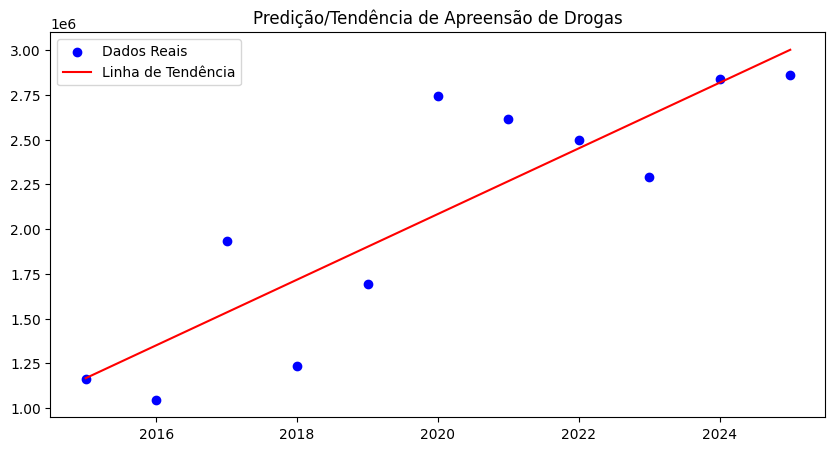

In [90]:
#Visualizando a linha de tedêndia
plt.figure(figsize=(10,5))
plt.scatter(X, y, color='blue', label='Dados Reais')
plt.plot(X, previsao, color='red', label='Linha de Tendência')
plt.title('Predição/Tendência de Apreensão de Drogas')
plt.legend()
plt.show()